# Packages 

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [2]:
import networkx as nx
import matplotlib.pyplot as plt

In [3]:
import math

In [4]:
absolute_path = 'Data/data2/'

In [5]:
# Read facebook dataset
plt.figure(figsize=(30,20))
G=nx.read_edgelist('Data/fbData.txt',create_using=nx.Graph(),nodetype=int)


<Figure size 3000x2000 with 0 Axes>

In [6]:
row = G.number_of_nodes()

In [7]:
row

4039

In [8]:
edge_mat= nx.to_numpy_array(G, nodelist=[i for i in range(row)])

In [9]:
print (edge_mat)

[[0. 1. 1. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [10]:
#Read our decision Matrix
data = pd.read_csv("Data/Matrix.csv")
data

,Node,w_Node,DC,BC,CC,EC
0,0,0,0.085934,1.463059e-01,0.353343,3.391796e-05
1,1,1,0.004210,2.783274e-06,0.261376,6.045346e-07
2,2,2,0.002476,7.595021e-08,0.261258,2.233461e-07
3,3,3,0.004210,1.685066e-06,0.261376,6.635648e-07
4,4,4,0.002476,1.840332e-07,0.261258,2.236416e-07
...,...,...,...,...,...,...
4034,4034,4034,0.000495,0.000000e+00,0.183989,2.951270e-10
4035,4035,4035,0.000248,0.000000e+00,0.183980,2.912901e-10
4036,4036,4036,0.000495,0.000000e+00,0.183989,2.931223e-10
4037,4037,4037,0.000991,7.156847e-08,0.184005,2.989233e-10


In [11]:
k=data.sort_values(by = ['w_Node'])
#data.to_csv("data.csv",index=False)

In [12]:
k

,Node,w_Node,DC,BC,CC,EC
0,0,0,0.085934,1.463059e-01,0.353343,3.391796e-05
1,1,1,0.004210,2.783274e-06,0.261376,6.045346e-07
2,2,2,0.002476,7.595021e-08,0.261258,2.233461e-07
3,3,3,0.004210,1.685066e-06,0.261376,6.635648e-07
4,4,4,0.002476,1.840332e-07,0.261258,2.236416e-07
...,...,...,...,...,...,...
4034,4034,4034,0.000495,0.000000e+00,0.183989,2.951270e-10
4035,4035,4035,0.000248,0.000000e+00,0.183980,2.912901e-10
4036,4036,4036,0.000495,0.000000e+00,0.183989,2.931223e-10
4037,4037,4037,0.000991,7.156847e-08,0.184005,2.989233e-10


In [13]:
k.to_csv("data.csv",index=False)

In [14]:
X = data[["DC","BC","CC","EC"]]


In [15]:
X

,DC,BC,CC,EC
0,0.085934,1.463059e-01,0.353343,3.391796e-05
1,0.004210,2.783274e-06,0.261376,6.045346e-07
2,0.002476,7.595021e-08,0.261258,2.233461e-07
3,0.004210,1.685066e-06,0.261376,6.635648e-07
4,0.002476,1.840332e-07,0.261258,2.236416e-07
...,...,...,...,...
4034,0.000495,0.000000e+00,0.183989,2.951270e-10
4035,0.000248,0.000000e+00,0.183980,2.912901e-10
4036,0.000495,0.000000e+00,0.183989,2.931223e-10
4037,0.000991,7.156847e-08,0.184005,2.989233e-10


In [16]:
influential = pd.read_csv("Data/w_Out1.csv")
inf10 = influential.head(10)
inf10

,Node,w_Node,DC,BC,CC,EC,C
0,107,107,0.258791,0.480518,0.459699,2.606940e-04,0.927913
1,1684,1684,0.196137,0.337797,0.393606,7.164260e-06,0.696069
2,3437,3437,0.135463,0.236115,0.314413,9.531613e-08,0.488526
3,1912,1912,0.186974,0.229295,0.350947,9.540696e-02,0.480827
4,1085,1085,0.016345,0.149015,0.357852,3.164082e-06,0.308478
5,0,0,0.085934,0.146306,0.353343,3.391796e-05,0.303198
6,698,698,0.016840,0.115330,0.271189,1.116876e-09,0.238868
7,567,567,0.015602,0.096310,0.328881,9.932295e-06,0.199523
8,58,58,0.002972,0.084360,0.397402,5.898120e-04,0.174775
9,428,428,0.028479,0.064309,0.394837,5.990065e-04,0.133340


# Top 10 influent (w_topsis)

In [17]:
Y = inf10[["DC","BC","CC","EC"]]
Yrr = Y.to_numpy()
Yrr

array([[2.58791481e-01, 4.80518079e-01, 4.59699454e-01, 2.60693991e-04],
       [1.96136701e-01, 3.37797450e-01, 3.93605615e-01, 7.16425979e-06],
       [1.35463101e-01, 2.36115357e-01, 3.14412520e-01, 9.53161293e-08],
       [1.86973749e-01, 2.29295340e-01, 3.50947332e-01, 9.54069615e-02],
       [1.63447251e-02, 1.49015092e-01, 3.57851826e-01, 3.16408207e-06],
       [8.59336305e-02, 1.46305921e-01, 3.53342667e-01, 3.39179617e-05],
       [1.68400198e-02, 1.15330450e-01, 2.71188717e-01, 1.11687629e-09],
       [1.56017831e-02, 9.63103312e-02, 3.28880925e-01, 9.93229483e-06],
       [2.97176820e-03, 8.43602059e-02, 3.97401831e-01, 5.89812015e-04],
       [2.84794453e-02, 6.43090624e-02, 3.94837196e-01, 5.99006469e-04]])

# Function Score (utilisation DC,EC,EC)

In [18]:
def score(X,weight):
    scr = []
    for i in range(X.shape[0]):
        DEC = weight[0]*X['DC'][i]+weight[1]*X['BC'][i]+weight[2]*X['EC'][i]
        scr.append(DEC)
    return scr

weights=[0.4,0.2,0.2]
ss = score(data,weights)

In [19]:
ss

[0.0954553465445931,
 0.00252689840755582,
 0.0014859292207130073,
 0.002526574847945817,
 0.0014859616751587727,
 0.001932429452812512,
 0.0008915595309939743,
 0.0030254262573069226,
 0.0011888120695208804,
 0.008474697058482016,
 0.001485976146929197,
 0.00014860944133728346,
 0.00014860944133728346,
 0.004606879773806453,
 0.0022290166933900107,
 0.00014860944133728346,
 0.0013373817944498077,
 0.0019317953055294,
 0.00014860944133728346,
 0.002378956598145501,
 0.002229053001235825,
 0.009942250547646785,
 0.0016347772554156106,
 0.0025280843550090316,
 0.0023774804577183103,
 0.010268973751369245,
 0.010110051559575237,
 0.0007429897526736628,
 0.0019317864594533838,
 0.001932097252523773,
 0.0025265101017948803,
 0.0034191585277236476,
 0.0008915521871840813,
 0.00029719798292015057,
 0.001823975907433678,
 0.00029719799161087297,
 0.0016345042509787547,
 0.00014860944133728346,
 0.0013375882165070523,
 0.0022291613036226764,
 0.006542207382128942,
 0.003567548125952867,
 0.0002

# distance using closeness measure

In [22]:
def dist(ss):
    dist0=[]
    ce=[]
    min = 13000 # 1300 l'inicialisation
    for i in range(0,10):
        for j in range(len(ss)):
          # Using the reciprocal of the absolute difference of the CC values
            dist= 1/(abs(ss[i]-ss[j]))
            dist0.append(dist)
            A=dist0
       
    n=10 
    B=[A[i:i+n] for i in range(0,len(A),n)]
    return B
dst=dist(ss)
dst
dst1= np.asarray(dst)
dst1

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\3200958014.py:8: RuntimeWarning: divide by zero encountered in double_scalars
  dist= 1/(abs(ss[i]-ss[j]))


array([[         inf,  10.76096739,  10.64176014, ...,  10.81900749,
         10.60821855,  11.49680999],
       [ 10.64176546,  10.49243768,  10.49243768, ...,  10.69249389,
         10.49243768,  10.74386319],
       [ 10.72658755,  11.69411525,  10.65864349, ...,  10.55828441,
         10.69249288,  10.69252841],
       ...,
       [126.89802344, 120.10412616, 143.08733205, ..., 120.10412616,
        126.89802344, 140.1110927 ],
       [134.50678454, 137.25088651, 137.25287967, ..., 126.89802344,
        140.10935256, 134.50975318],
       [122.28646025, 122.28646025, 176.98630763, ..., 122.28646025,
        126.89836918, 140.11074977]])

# Modification Kmeans

In [23]:
def kmeans(X, k, maxiter,yrr,distance,seed = None):
   
    n_row, n_col = X.shape

    if seed is not None:
        np.random.seed(seed)
    
    rand_indices = np.random.choice(n_row, size = k)
    centroids =yrr

    for itr in range(maxiter):
       
        distances_to_centroids = distance
        cluster_assignment = np.argmin(distances_to_centroids, axis = 1)

       
        new_centroids = np.array([X[cluster_assignment == i].mean(axis = 0) for i in range(k)])
        
       
        if np.all(centroids == new_centroids):
            break
        
        centroids = new_centroids
    
    return centroids, cluster_assignment


In [24]:
centroids, cluster_assignment=kmeans(X,10,20000,Yrr,dst1)

In [25]:
centroids

array([[1.16899051e-02, 3.98201805e-04, 2.80829242e-01, 3.73618958e-03],
       [1.07066807e-02, 6.21022506e-04, 2.76003829e-01, 4.29255551e-03],
       [1.06000296e-02, 1.46850560e-03, 2.74261919e-01, 3.78488184e-03],
       [1.05103922e-02, 8.26287752e-04, 2.76621002e-01, 3.59872848e-03],
       [1.10037122e-02, 6.52694847e-04, 2.77577478e-01, 4.14024835e-03],
       [1.10856314e-02, 2.71524452e-04, 2.78231429e-01, 3.83961116e-03],
       [1.09737136e-02, 6.20068899e-04, 2.75397137e-01, 4.52377376e-03],
       [1.03495955e-02, 3.67266979e-04, 2.73445955e-01, 3.36677920e-03],
       [1.08490227e-02, 2.49091619e-04, 2.73634821e-01, 4.24304643e-03],
       [1.04581536e-02, 1.15636023e-03, 2.75746291e-01, 3.17599070e-03]])

In [26]:
cluster_assignment

array([6, 1, 7, ..., 1, 4, 6], dtype=int64)

In [34]:
def distance_euclidean(data,center,j):
    T= pd.DataFrame()
    for i in range(len(data)):
        distance=math.sqrt((data['DC'][i]-center[j][0])**2+(data['BC'][i]-center[j][1])**2+
                           (data['CC'][i]-center[j][2])**2+(data['EC'][i]-center[j][3])**2)
        T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
    return T.sort_values(by='distance from center',ascending=False)

In [35]:
Res= pd.DataFrame()
for i in range(10):
    T=distance_euclidean(data,centroids,i)
    Res=Res.append({'cluster':str(i), 'Node_before_KMeans':str(inf10['Node'][i]),
                    'Node_after_KMeans':int(T.head(1)['Node']),
                    'distance from center':float(T.head(1)['distance from center'])},ignore_index=True)

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\3878829715.py:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Res=Res.append({'cluster':str(i), 'Node_before_KMeans':str(inf10['Node'][i]),
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning:

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\3878829715.py:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Res=Res.append({'cluster':str(i), 'Node_before_KMeans':str(inf10['Node'][i]),
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning:

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\676980551.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\6769

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\3878829715.py:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Res=Res.append({'cluster':str(i), 'Node_before_KMeans':str(inf10['Node'][i]),


In [36]:
Res

,cluster,Node_before_KMeans,Node_after_KMeans,distance from center
0,0,107,107,0.568842
1,1,1684,107,0.570620
2,2,3437,107,0.570515
3,3,1912,107,0.570330
4,4,1085,107,0.569959
5,5,0,107,0.570034
6,6,698,107,0.570702
7,7,567,107,0.571811
8,8,58,107,0.571638
9,9,428,107,0.570355


In [37]:
Res["Node_after_KMeans"] = Res["Node_after_KMeans"].astype(int)

In [38]:
Res["Node_after_KMeans"]

0    107
1    107
2    107
3    107
4    107
5    107
6    107
7    107
8    107
9    107
Name: Node_after_KMeans, dtype: int32

In [39]:
#convert to DataFrame
lab = pd.DataFrame(cluster_assignment, columns=['center'])
lab

,center
0,6
1,1
2,7
3,7
4,3
...,...
4034,1
4035,4
4036,1
4037,4


In [40]:
#Community of each Node
community = pd.concat([data, lab], axis=1)
community.head(40)


,Node,w_Node,DC,BC,CC,EC,center
0,0,0,0.085934,1.463059e-01,0.353343,3.391796e-05,6
1,1,1,0.004210,2.783274e-06,0.261376,6.045346e-07,1
2,2,2,0.002476,7.595021e-08,0.261258,2.233461e-07,7
3,3,3,0.004210,1.685066e-06,0.261376,6.635648e-07,7
4,4,4,0.002476,1.840332e-07,0.261258,2.236416e-07,3
5,5,5,0.003219,2.205964e-06,0.261308,1.183322e-06,2
6,6,6,0.001486,2.453776e-08,0.261190,2.170904e-07,1
7,7,7,0.004953,1.702985e-04,0.274769,2.568510e-05,4
8,8,8,0.001981,2.760498e-07,0.261224,2.197375e-07,1
9,9,9,0.014116,1.645424e-05,0.262055,2.214117e-06,0


In [41]:
gk = community.groupby('center')
n=gk.first()
n

,Node,w_Node,DC,BC,CC,EC
center,,,,,,
0,9,9,0.014116,1.645424e-05,0.262055,2.214117e-06
1,1,1,0.004210,2.783274e-06,0.261376,6.045346e-07
2,5,5,0.003219,2.205964e-06,0.261308,1.183322e-06
3,4,4,0.002476,1.840332e-07,0.261258,2.236416e-07
4,7,7,0.004953,1.702985e-04,0.274769,2.568510e-05
5,14,14,0.003715,5.582872e-07,0.261342,2.305568e-07
6,0,0,0.085934,1.463059e-01,0.353343,3.391796e-05
7,2,2,0.002476,7.595021e-08,0.261258,2.233461e-07
8,13,13,0.007677,1.762272e-06,0.261613,1.103791e-06


In [42]:
commNum = community['Node'].to_numpy()

In [43]:
community

,Node,w_Node,DC,BC,CC,EC,center
0,0,0,0.085934,1.463059e-01,0.353343,3.391796e-05,6
1,1,1,0.004210,2.783274e-06,0.261376,6.045346e-07,1
2,2,2,0.002476,7.595021e-08,0.261258,2.233461e-07,7
3,3,3,0.004210,1.685066e-06,0.261376,6.635648e-07,7
4,4,4,0.002476,1.840332e-07,0.261258,2.236416e-07,3
...,...,...,...,...,...,...,...
4034,4034,4034,0.000495,0.000000e+00,0.183989,2.951270e-10,1
4035,4035,4035,0.000248,0.000000e+00,0.183980,2.912901e-10,4
4036,4036,4036,0.000495,0.000000e+00,0.183989,2.931223e-10,1
4037,4037,4037,0.000991,7.156847e-08,0.184005,2.989233e-10,4


In [44]:
recomm = Res["Node_after_KMeans"]
recomm

0    107
1    107
2    107
3    107
4    107
5    107
6    107
7    107
8    107
9    107
Name: Node_after_KMeans, dtype: int32

In [45]:
df1=[]
df2=[]
df3=[]
df4=[]
df5=[]
for i in range(10):
    for j in range(row):
        if (recomm[i] == data['Node'][j]):
            df1.append(data['Node'][j].tolist())
            df2.append(data['DC'][j].tolist())
            df3.append(data['BC'][j].tolist())
            df4.append(data['CC'][j].tolist())
            df5.append(data['EC'][j].tolist())

            
#df = pd.DataFrame(df1,df2,df3,df4,df5,columns = ['Node','DC','BC','CC','EC'])
list1 = [df1,df2,df3,df4,df5]

In [46]:
dff1 = pd.DataFrame(df1,columns = ['Node'])
dff2 = pd.DataFrame(df2,columns = ['DC'])
dff3 = pd.DataFrame(df3,columns = ['BC'])
dff4 = pd.DataFrame(df4,columns = ['CC'])
dff5 = pd.DataFrame(df5,columns = ['EC'])

In [47]:
Final_Tab = pd.concat([dff1,dff2,dff3,dff4,dff5],axis=1)
Final_Tab

,Node,DC,BC,CC,EC
0,107,0.258791,0.480518,0.459699,0.000261
1,107,0.258791,0.480518,0.459699,0.000261
2,107,0.258791,0.480518,0.459699,0.000261
3,107,0.258791,0.480518,0.459699,0.000261
4,107,0.258791,0.480518,0.459699,0.000261
5,107,0.258791,0.480518,0.459699,0.000261
6,107,0.258791,0.480518,0.459699,0.000261
7,107,0.258791,0.480518,0.459699,0.000261
8,107,0.258791,0.480518,0.459699,0.000261
9,107,0.258791,0.480518,0.459699,0.000261


In [48]:
#Regrouper les communitées dans une  list comm
#à l'intérieur de chaque liste on trouve les noeuds appartient à une communauté 
comm = []
for i in range(10):
    comm.append(gk.get_group(i)['Node'].tolist())


In [49]:
Comm= []
for i in range(10):
    print("Nodes of Community [",i,"] =",comm[i])

Nodes of Community [ 0 ] = [9, 16, 21, 34, 52, 71, 88, 96, 105, 115, 124, 135, 155, 161, 165, 175, 176, 182, 187, 192, 193, 204, 206, 208, 224, 231, 232, 239, 258, 267, 283, 291, 295, 306, 310, 3290, 376, 563, 580, 907, 909, 913, 915, 919, 935, 944, 945, 947, 953, 955, 959, 975, 980, 985, 997, 1000, 1010, 1040, 1041, 1048, 1059, 1061, 1074, 1083, 1100, 1101, 1119, 1120, 1143, 1163, 1168, 1170, 1173, 1176, 1182, 1202, 1204, 1205, 1252, 1259, 1264, 1276, 1296, 1303, 1329, 1330, 1334, 1336, 1339, 1346, 1347, 1354, 1355, 1357, 1360, 1361, 1365, 1367, 1371, 1379, 1383, 1384, 1385, 1396, 1422, 1424, 1446, 1453, 1457, 1476, 1485, 1499, 1502, 1511, 1515, 1526, 1543, 1545, 1558, 1560, 1577, 1582, 1584, 1587, 1605, 1609, 1611, 1612, 1622, 1633, 1644, 1646, 1647, 1660, 1670, 1671, 1681, 1696, 1710, 1724, 1731, 1747, 1748, 1756, 1770, 1772, 1777, 1786, 1803, 1813, 1819, 1820, 1833, 1847, 1852, 1862, 1864, 1871, 1877, 1883, 1884, 1893, 1899, 1903, 1911, 1939, 2001, 2042, 2071, 2072, 2102, 2127, 215

9
 	 node 9 is connected with :21
 	 node 9 is connected with :105
 	 node 9 is connected with :161
 	 node 9 is connected with :176
 	 node 9 is connected with :224
 	 node 9 is connected with :231
 	 node 9 is connected with :232
 	 node 9 is connected with :258
 	 node 9 is connected with :291
 	 node 9 is connected with :295
16
21
 	 node 21 is connected with :9
 	 node 21 is connected with :88
 	 node 21 is connected with :105
 	 node 21 is connected with :161
 	 node 21 is connected with :165
 	 node 21 is connected with :232
 	 node 21 is connected with :239
34
52
 	 node 52 is connected with :192
71
88
 	 node 88 is connected with :21
96
 	 node 96 is connected with :224
105
 	 node 105 is connected with :9
 	 node 105 is connected with :21
115
 	 node 115 is connected with :192
124
135
155
161
 	 node 161 is connected with :9
 	 node 161 is connected with :21
 	 node 161 is connected with :258
165
 	 node 165 is connected with :21
175
176
 	 node 176 is connected with :9
 	 no

1334
 	 node 1334 is connected with :980
 	 node 1334 is connected with :1048
 	 node 1334 is connected with :1059
 	 node 1334 is connected with :1182
 	 node 1334 is connected with :1329
 	 node 1334 is connected with :1361
 	 node 1334 is connected with :1584
 	 node 1334 is connected with :1612
 	 node 1334 is connected with :1813
 	 node 1334 is connected with :1833
1336
 	 node 1336 is connected with :953
 	 node 1336 is connected with :997
 	 node 1336 is connected with :1083
 	 node 1336 is connected with :1101
 	 node 1336 is connected with :1622
 	 node 1336 is connected with :1833
1339
 	 node 1339 is connected with :1059
 	 node 1339 is connected with :1367
 	 node 1339 is connected with :1424
 	 node 1339 is connected with :1584
 	 node 1339 is connected with :1612
 	 node 1339 is connected with :1622
 	 node 1339 is connected with :1644
 	 node 1339 is connected with :1724
 	 node 1339 is connected with :1819
 	 node 1339 is connected with :1833
1346
1347
 	 node 1347 is 

1862
 	 node 1862 is connected with :975
 	 node 1862 is connected with :1100
 	 node 1862 is connected with :1120
 	 node 1862 is connected with :1379
 	 node 1862 is connected with :1611
 	 node 1862 is connected with :1647
 	 node 1862 is connected with :1899
 	 node 1862 is connected with :1903
1864
 	 node 1864 is connected with :947
 	 node 1864 is connected with :1040
 	 node 1864 is connected with :1048
 	 node 1864 is connected with :1074
 	 node 1864 is connected with :1101
 	 node 1864 is connected with :1205
 	 node 1864 is connected with :1329
 	 node 1864 is connected with :1584
 	 node 1864 is connected with :1609
 	 node 1864 is connected with :1813
1871
 	 node 1871 is connected with :919
 	 node 1871 is connected with :1170
 	 node 1871 is connected with :1204
 	 node 1871 is connected with :1303
 	 node 1871 is connected with :1396
 	 node 1871 is connected with :1502
 	 node 1871 is connected with :1515
 	 node 1871 is connected with :1582
 	 node 1871 is connected 

686
 	 node 686 is connected with :690
 	 node 686 is connected with :693
 	 node 686 is connected with :704
 	 node 686 is connected with :718
 	 node 686 is connected with :730
 	 node 686 is connected with :765
 	 node 686 is connected with :767
 	 node 686 is connected with :773
 	 node 686 is connected with :774
 	 node 686 is connected with :789
 	 node 686 is connected with :797
 	 node 686 is connected with :834
 	 node 686 is connected with :848
 	 node 686 is connected with :849
 	 node 686 is connected with :852
 	 node 686 is connected with :853
690
 	 node 690 is connected with :686
 	 node 690 is connected with :773
 	 node 690 is connected with :853
693
 	 node 693 is connected with :686
 	 node 693 is connected with :834
704
 	 node 704 is connected with :686
 	 node 704 is connected with :848
718
 	 node 718 is connected with :686
 	 node 718 is connected with :730
 	 node 718 is connected with :797
 	 node 718 is connected with :834
730
 	 node 730 is connected with :

2762
 	 node 2762 is connected with :2841
 	 node 2762 is connected with :3279
2767
2782
 	 node 2782 is connected with :2669
 	 node 2782 is connected with :2862
 	 node 2782 is connected with :2911
 	 node 2782 is connected with :3022
 	 node 2782 is connected with :3026
 	 node 2782 is connected with :3052
 	 node 2782 is connected with :3054
 	 node 2782 is connected with :3084
 	 node 2782 is connected with :3096
 	 node 2782 is connected with :3174
 	 node 2782 is connected with :3213
 	 node 2782 is connected with :3232
 	 node 2782 is connected with :3426
2795
 	 node 2795 is connected with :2668
2805
2807
 	 node 2807 is connected with :2710
 	 node 2807 is connected with :3084
 	 node 2807 is connected with :3231
 	 node 2807 is connected with :3400
2841
 	 node 2841 is connected with :2762
 	 node 2841 is connected with :2858
 	 node 2841 is connected with :2954
 	 node 2841 is connected with :3117
 	 node 2841 is connected with :3208
 	 node 2841 is connected with :3424
284

 	 node 3426 is connected with :2911
 	 node 3426 is connected with :3022
 	 node 3426 is connected with :3026
 	 node 3426 is connected with :3054
 	 node 3426 is connected with :3084
 	 node 3426 is connected with :3096
 	 node 3426 is connected with :3137
 	 node 3426 is connected with :3174
 	 node 3426 is connected with :3232
 	 node 3426 is connected with :3392
2155
 	 node 2155 is connected with :1970
 	 node 2155 is connected with :2603
1918
 	 node 1918 is connected with :1946
 	 node 1918 is connected with :1963
 	 node 1918 is connected with :1997
 	 node 1918 is connected with :2059
 	 node 1918 is connected with :2098
 	 node 1918 is connected with :2112
 	 node 1918 is connected with :2206
 	 node 1918 is connected with :2271
 	 node 1918 is connected with :2329
 	 node 1918 is connected with :2348
 	 node 1918 is connected with :2352
 	 node 1918 is connected with :2433
 	 node 1918 is connected with :2591
 	 node 1918 is connected with :2601
1928
 	 node 1928 is connect

 	 node 2428 is connected with :1946
 	 node 2428 is connected with :1963
 	 node 2428 is connected with :1997
 	 node 2428 is connected with :2059
 	 node 2428 is connected with :2067
 	 node 2428 is connected with :2092
 	 node 2428 is connected with :2098
 	 node 2428 is connected with :2112
 	 node 2428 is connected with :2147
 	 node 2428 is connected with :2206
 	 node 2428 is connected with :2237
 	 node 2428 is connected with :2329
 	 node 2428 is connected with :2348
 	 node 2428 is connected with :2352
 	 node 2428 is connected with :2395
 	 node 2428 is connected with :2407
 	 node 2428 is connected with :2418
 	 node 2428 is connected with :2429
 	 node 2428 is connected with :2433
 	 node 2428 is connected with :2591
 	 node 2428 is connected with :2601
2429
 	 node 2429 is connected with :2067
 	 node 2429 is connected with :2071
 	 node 2429 is connected with :2092
 	 node 2429 is connected with :2112
 	 node 2429 is connected with :2206
 	 node 2429 is connected with :2

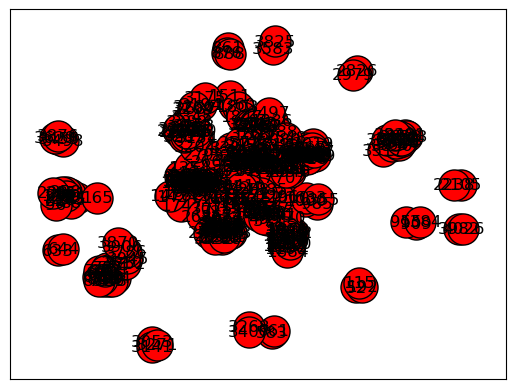

1
 	 node 1 is connected with :126
 	 node 1 is connected with :236
6
 	 node 6 is connected with :219
8
 	 node 8 is connected with :110
 	 node 8 is connected with :201
19
 	 node 19 is connected with :138
 	 node 19 is connected with :227
 	 node 19 is connected with :293
32
 	 node 32 is connected with :93
35
43
44
55
59
 	 node 59 is connected with :271
63
 	 node 63 is connected with :271
78
 	 node 78 is connected with :218
93
 	 node 93 is connected with :32
94
 	 node 94 is connected with :242
 	 node 94 is connected with :266
110
 	 node 110 is connected with :8
126
 	 node 126 is connected with :1
 	 node 126 is connected with :260
134
 	 node 134 is connected with :248
138
 	 node 138 is connected with :19
168
173
 	 node 173 is connected with :202
 	 node 173 is connected with :427
 	 node 173 is connected with :549
201
 	 node 201 is connected with :8
202
 	 node 202 is connected with :173
 	 node 202 is connected with :329
205
210
216
218
 	 node 218 is connected with :7

1844
 	 node 1844 is connected with :930
 	 node 1844 is connected with :1012
 	 node 1844 is connected with :1122
 	 node 1844 is connected with :1408
 	 node 1844 is connected with :1549
1859
 	 node 1859 is connected with :896
 	 node 1859 is connected with :957
 	 node 1859 is connected with :1229
 	 node 1859 is connected with :1277
 	 node 1859 is connected with :1459
 	 node 1859 is connected with :1479
1860
 	 node 1860 is connected with :1305
1863
 	 node 1863 is connected with :1256
 	 node 1863 is connected with :1305
 	 node 1863 is connected with :1398
 	 node 1863 is connected with :1447
 	 node 1863 is connected with :1488
 	 node 1863 is connected with :1712
1894
 	 node 1894 is connected with :1018
 	 node 1894 is connected with :1020
 	 node 1894 is connected with :1081
 	 node 1894 is connected with :1099
 	 node 1894 is connected with :1108
 	 node 1894 is connected with :1277
 	 node 1894 is connected with :1742
 	 node 1894 is connected with :1824
1902
 	 node 190

 	 node 2530 is connected with :1913
 	 node 2530 is connected with :2148
 	 node 2530 is connected with :2302
 	 node 2530 is connected with :2560
1913
 	 node 1913 is connected with :2116
 	 node 1913 is connected with :2312
 	 node 1913 is connected with :2530
 	 node 1913 is connected with :2616
1916
 	 node 1916 is connected with :1932
 	 node 1916 is connected with :1940
 	 node 1916 is connected with :2002
 	 node 1916 is connected with :2133
 	 node 1916 is connected with :2143
 	 node 1916 is connected with :2183
 	 node 1916 is connected with :2294
 	 node 1916 is connected with :2498
 	 node 1916 is connected with :2616
1940
 	 node 1940 is connected with :1916
 	 node 1940 is connected with :2026
 	 node 1940 is connected with :2133
 	 node 1940 is connected with :2143
 	 node 1940 is connected with :2148
 	 node 1940 is connected with :2191
 	 node 1940 is connected with :2294
 	 node 1940 is connected with :2302
 	 node 1940 is connected with :2498
 	 node 1940 is connect

 	 node 3249 is connected with :2812
3254
 	 node 3254 is connected with :3005
 	 node 3254 is connected with :3148
3275
 	 node 3275 is connected with :2820
 	 node 3275 is connected with :2934
3301
 	 node 3301 is connected with :2743
 	 node 3301 is connected with :2757
 	 node 3301 is connected with :2827
 	 node 3301 is connected with :2944
 	 node 3301 is connected with :2948
 	 node 3301 is connected with :2966
 	 node 3301 is connected with :3129
3306
 	 node 3306 is connected with :2819
 	 node 3306 is connected with :3082
 	 node 3306 is connected with :3148
 	 node 3306 is connected with :3331
3309
 	 node 3309 is connected with :2670
 	 node 3309 is connected with :3325
 	 node 3309 is connected with :3382
3321
 	 node 3321 is connected with :3038
 	 node 3321 is connected with :3082
 	 node 3321 is connected with :3197
3325
 	 node 3325 is connected with :2670
 	 node 3325 is connected with :3309
 	 node 3325 is connected with :3382
3336
 	 node 3336 is connected with :294

 	 node 3565 is connected with :3437
3569
 	 node 3569 is connected with :3437
 	 node 3569 is connected with :3458
 	 node 3569 is connected with :3463
 	 node 3569 is connected with :3509
3574
 	 node 3574 is connected with :3437
 	 node 3574 is connected with :3605
3590
 	 node 3590 is connected with :3437
 	 node 3590 is connected with :3615
 	 node 3590 is connected with :3636
 	 node 3590 is connected with :3710
 	 node 3590 is connected with :3722
 	 node 3590 is connected with :3835
3605
 	 node 3605 is connected with :3437
 	 node 3605 is connected with :3574
 	 node 3605 is connected with :3785
 	 node 3605 is connected with :3938
3615
 	 node 3615 is connected with :3437
 	 node 3615 is connected with :3590
 	 node 3615 is connected with :3636
 	 node 3615 is connected with :3835
3623
 	 node 3623 is connected with :3437
 	 node 3623 is connected with :3768
3636
 	 node 3636 is connected with :3437
 	 node 3636 is connected with :3590
 	 node 3636 is connected with :3615
 	 

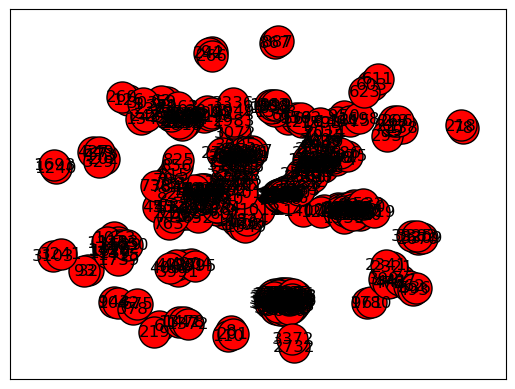

5
 	 node 5 is connected with :87
 	 node 5 is connected with :156
 	 node 5 is connected with :213
29
53
 	 node 53 is connected with :191
 	 node 53 is connected with :213
 	 node 53 is connected with :299
58
 	 node 58 is connected with :107
 	 node 58 is connected with :2885
66
 	 node 66 is connected with :308
 	 node 66 is connected with :334
69
76
77
81
87
 	 node 87 is connected with :5
 	 node 87 is connected with :213
 	 node 87 is connected with :246
 	 node 87 is connected with :308
95
97
103
 	 node 103 is connected with :323
107
 	 node 107 is connected with :58
 	 node 107 is connected with :629
 	 node 107 is connected with :649
 	 node 107 is connected with :651
 	 node 107 is connected with :922
 	 node 107 is connected with :938
 	 node 107 is connected with :939
 	 node 107 is connected with :968
 	 node 107 is connected with :977
 	 node 107 is connected with :994
 	 node 107 is connected with :1003
 	 node 107 is connected with :1004
 	 node 107 is connected with 

 	 node 1094 is connected with :1831
1102
 	 node 1102 is connected with :107
 	 node 1102 is connected with :1245
 	 node 1102 is connected with :1454
 	 node 1102 is connected with :1508
 	 node 1102 is connected with :1729
 	 node 1102 is connected with :1848
1105
 	 node 1105 is connected with :107
 	 node 1105 is connected with :1890
1115
 	 node 1115 is connected with :107
 	 node 1115 is connected with :1550
 	 node 1115 is connected with :1872
1125
 	 node 1125 is connected with :107
 	 node 1125 is connected with :1024
 	 node 1125 is connected with :1211
 	 node 1125 is connected with :1288
 	 node 1125 is connected with :1302
 	 node 1125 is connected with :1352
 	 node 1125 is connected with :1620
 	 node 1125 is connected with :1714
 	 node 1125 is connected with :1795
 	 node 1125 is connected with :1842
 	 node 1125 is connected with :1886
1128
 	 node 1128 is connected with :107
 	 node 1128 is connected with :1004
 	 node 1128 is connected with :1075
 	 node 1128 is co

1795
 	 node 1795 is connected with :107
 	 node 1795 is connected with :1003
 	 node 1795 is connected with :1004
 	 node 1795 is connected with :1075
 	 node 1795 is connected with :1125
 	 node 1795 is connected with :1344
 	 node 1795 is connected with :1352
 	 node 1795 is connected with :1375
 	 node 1795 is connected with :1714
1802
 	 node 1802 is connected with :107
1815
 	 node 1815 is connected with :107
 	 node 1815 is connected with :977
 	 node 1815 is connected with :1011
 	 node 1815 is connected with :1131
1829
 	 node 1829 is connected with :107
 	 node 1829 is connected with :939
 	 node 1829 is connected with :1831
1831
 	 node 1831 is connected with :107
 	 node 1831 is connected with :939
 	 node 1831 is connected with :977
 	 node 1831 is connected with :1094
 	 node 1831 is connected with :1131
 	 node 1831 is connected with :1162
 	 node 1831 is connected with :1169
 	 node 1831 is connected with :1189
 	 node 1831 is connected with :1497
 	 node 1831 is connec

843
 	 node 843 is connected with :703
846
 	 node 846 is connected with :785
864
 	 node 864 is connected with :884
871
880
 	 node 880 is connected with :703
 	 node 880 is connected with :803
884
 	 node 884 is connected with :864
3501
 	 node 3501 is connected with :3756
 	 node 3501 is connected with :3760
 	 node 3501 is connected with :3851
 	 node 3501 is connected with :3873
3756
 	 node 3756 is connected with :3501
 	 node 3756 is connected with :3576
 	 node 3756 is connected with :3693
 	 node 3756 is connected with :3851
3851
 	 node 3851 is connected with :3501
 	 node 3851 is connected with :3693
 	 node 3851 is connected with :3756
 	 node 3851 is connected with :3873
 	 node 3851 is connected with :3966
2752
 	 node 2752 is connected with :2734
 	 node 2752 is connected with :2962
2962
 	 node 2962 is connected with :2752
 	 node 2962 is connected with :3001
3001
 	 node 3001 is connected with :2682
 	 node 3001 is connected with :2870
 	 node 3001 is connected with :2

 	 node 2416 is connected with :2038
 	 node 2416 is connected with :2047
 	 node 2416 is connected with :2325
 	 node 2416 is connected with :2610
2464
 	 node 2464 is connected with :1985
 	 node 2464 is connected with :2033
 	 node 2464 is connected with :2040
 	 node 2464 is connected with :2073
 	 node 2464 is connected with :2086
 	 node 2464 is connected with :2123
 	 node 2464 is connected with :2131
 	 node 2464 is connected with :2188
 	 node 2464 is connected with :2218
 	 node 2464 is connected with :2244
 	 node 2464 is connected with :2266
 	 node 2464 is connected with :2324
 	 node 2464 is connected with :2381
 	 node 2464 is connected with :2539
 	 node 2464 is connected with :2542
 	 node 2464 is connected with :2543
 	 node 2464 is connected with :2554
 	 node 2464 is connected with :2575
2513
2524
 	 node 2524 is connected with :1985
 	 node 2524 is connected with :2073
2539
 	 node 2539 is connected with :1985
 	 node 2539 is connected with :2033
 	 node 2539 is co

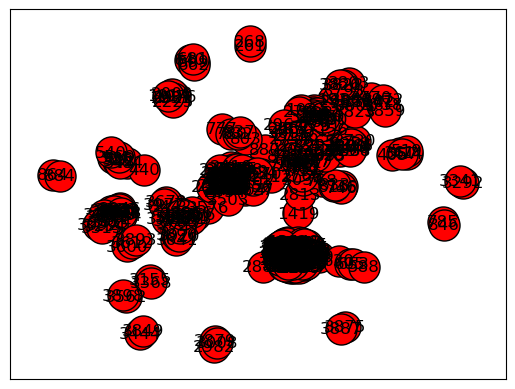

4
18
23
 	 node 23 is connected with :51
42
47
51
 	 node 51 is connected with :23
54
56
 	 node 56 is connected with :109
 	 node 56 is connected with :132
 	 node 56 is connected with :223
 	 node 56 is connected with :332
57
 	 node 57 is connected with :80
64
80
 	 node 80 is connected with :57
 	 node 80 is connected with :101
 	 node 80 is connected with :300
90
 	 node 90 is connected with :179
101
 	 node 101 is connected with :80
102
109
 	 node 109 is connected with :56
 	 node 109 is connected with :332
111
 	 node 111 is connected with :312
114
123
132
 	 node 132 is connected with :56
139
146
 	 node 146 is connected with :339
154
160
162
 	 node 162 is connected with :312
179
 	 node 179 is connected with :90
223
 	 node 223 is connected with :56
225
255
262
 	 node 262 is connected with :312
282
294
300
 	 node 300 is connected with :80
312
 	 node 312 is connected with :111
 	 node 312 is connected with :162
 	 node 312 is connected with :262
332
 	 node 332 is connecte

1653
 	 node 1653 is connected with :925
 	 node 1653 is connected with :1146
 	 node 1653 is connected with :1376
 	 node 1653 is connected with :1390
 	 node 1653 is connected with :1557
 	 node 1653 is connected with :1600
 	 node 1653 is connected with :1610
 	 node 1653 is connected with :1800
1666
 	 node 1666 is connected with :990
 	 node 1666 is connected with :1140
 	 node 1666 is connected with :1450
 	 node 1666 is connected with :2869
 	 node 1666 is connected with :3020
1676
 	 node 1676 is connected with :1410
1678
 	 node 1678 is connected with :990
 	 node 1678 is connected with :1222
 	 node 1678 is connected with :1450
1708
1720
 	 node 1720 is connected with :483
 	 node 1720 is connected with :1104
 	 node 1720 is connected with :1281
 	 node 1720 is connected with :1309
 	 node 1720 is connected with :1426
1740
 	 node 1740 is connected with :363
 	 node 1740 is connected with :483
 	 node 1740 is connected with :1300
 	 node 1740 is connected with :1645
1763
 	 n

575
 	 node 575 is connected with :664
594
607
618
621
664
 	 node 664 is connected with :575
677
687
 	 node 687 is connected with :817
698
 	 node 698 is connected with :713
 	 node 698 is connected with :811
 	 node 698 is connected with :840
 	 node 698 is connected with :865
 	 node 698 is connected with :868
 	 node 698 is connected with :879
 	 node 698 is connected with :883
 	 node 698 is connected with :886
 	 node 698 is connected with :889
 	 node 698 is connected with :893
712
 	 node 712 is connected with :822
713
 	 node 713 is connected with :698
 	 node 713 is connected with :724
 	 node 713 is connected with :748
 	 node 713 is connected with :762
 	 node 713 is connected with :817
 	 node 713 is connected with :824
 	 node 713 is connected with :840
 	 node 713 is connected with :850
724
 	 node 724 is connected with :713
 	 node 724 is connected with :786
 	 node 724 is connected with :824
748
 	 node 748 is connected with :713
 	 node 748 is connected with :817
750

 	 node 2937 is connected with :2753
 	 node 2937 is connected with :2869
 	 node 2937 is connected with :3206
2975
2985
 	 node 2985 is connected with :2698
 	 node 2985 is connected with :2839
 	 node 2985 is connected with :2872
 	 node 2985 is connected with :2912
 	 node 2985 is connected with :2928
 	 node 2985 is connected with :3339
2987
 	 node 2987 is connected with :3163
3004
 	 node 3004 is connected with :2800
 	 node 3004 is connected with :2839
 	 node 3004 is connected with :2908
 	 node 3004 is connected with :2912
 	 node 3004 is connected with :3324
3048
 	 node 3048 is connected with :3178
 	 node 3048 is connected with :3276
3050
3056
 	 node 3056 is connected with :2800
 	 node 3056 is connected with :2839
 	 node 3056 is connected with :2872
 	 node 3056 is connected with :2928
3069
3074
3081
 	 node 3081 is connected with :3259
 	 node 3081 is connected with :3266
3089
 	 node 3089 is connected with :2849
 	 node 3089 is connected with :3299
 	 node 3089 is conn

 	 node 2374 is connected with :1962
 	 node 2374 is connected with :1979
 	 node 2374 is connected with :2093
 	 node 2374 is connected with :2108
 	 node 2374 is connected with :2275
 	 node 2374 is connected with :2309
 	 node 2374 is connected with :2323
 	 node 2374 is connected with :2363
 	 node 2374 is connected with :2484
 	 node 2374 is connected with :2485
 	 node 2374 is connected with :2526
 	 node 2374 is connected with :2593
 	 node 2374 is connected with :2624
2380
2402
 	 node 2402 is connected with :2228
 	 node 2402 is connected with :2316
 	 node 2402 is connected with :2361
 	 node 2402 is connected with :2371
2411
 	 node 2411 is connected with :2193
 	 node 2411 is connected with :2228
2431
2432
 	 node 2432 is connected with :2081
 	 node 2432 is connected with :2272
 	 node 2432 is connected with :2282
2442
2450
2478
 	 node 2478 is connected with :2207
 	 node 2478 is connected with :2309
 	 node 2478 is connected with :2526
 	 node 2478 is connected with :262

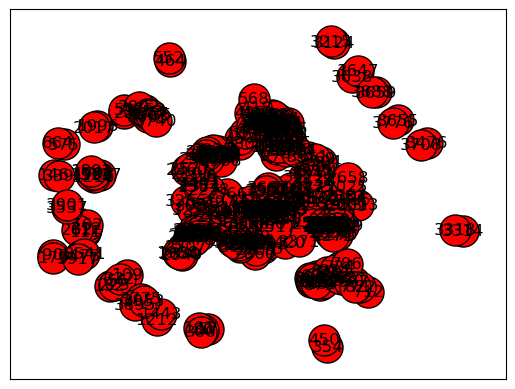

7
 	 node 7 is connected with :65
11
12
15
24
36
 	 node 36 is connected with :184
40
 	 node 40 is connected with :212
 	 node 40 is connected with :272
49
65
 	 node 65 is connected with :7
 	 node 65 is connected with :314
79
 	 node 79 is connected with :272
98
 	 node 98 is connected with :122
 	 node 98 is connected with :238
 	 node 98 is connected with :272
120
122
 	 node 122 is connected with :98
 	 node 122 is connected with :272
147
184
 	 node 184 is connected with :36
 	 node 184 is connected with :272
189
 	 node 189 is connected with :217
212
 	 node 212 is connected with :40
214
 	 node 214 is connected with :289
217
 	 node 217 is connected with :189
221
234
238
 	 node 238 is connected with :98
272
 	 node 272 is connected with :40
 	 node 272 is connected with :79
 	 node 272 is connected with :98
 	 node 272 is connected with :122
 	 node 272 is connected with :184
275
286
289
 	 node 289 is connected with :214
301
311
314
 	 node 314 is connected with :65
327
330


 	 node 1164 is connected with :1570
 	 node 1164 is connected with :1603
 	 node 1164 is connected with :1685
1185
 	 node 1185 is connected with :946
 	 node 1185 is connected with :993
 	 node 1185 is connected with :1017
 	 node 1185 is connected with :1123
 	 node 1185 is connected with :1132
 	 node 1185 is connected with :1149
 	 node 1185 is connected with :1153
 	 node 1185 is connected with :1271
 	 node 1185 is connected with :1272
 	 node 1185 is connected with :1335
 	 node 1185 is connected with :1522
 	 node 1185 is connected with :1554
 	 node 1185 is connected with :1570
 	 node 1185 is connected with :1597
 	 node 1185 is connected with :1603
 	 node 1185 is connected with :1619
 	 node 1185 is connected with :1659
 	 node 1185 is connected with :1685
 	 node 1185 is connected with :1737
 	 node 1185 is connected with :1804
 	 node 1185 is connected with :1809
1190
 	 node 1190 is connected with :1148
 	 node 1190 is connected with :1231
 	 node 1190 is connected with

 	 node 1688 is connected with :1737
 	 node 1688 is connected with :1754
 	 node 1688 is connected with :1804
 	 node 1688 is connected with :1811
1689
 	 node 1689 is connected with :906
 	 node 1689 is connected with :946
 	 node 1689 is connected with :993
 	 node 1689 is connected with :1149
 	 node 1689 is connected with :1230
 	 node 1689 is connected with :1522
 	 node 1689 is connected with :1551
 	 node 1689 is connected with :1554
 	 node 1689 is connected with :1597
 	 node 1689 is connected with :1632
 	 node 1689 is connected with :1659
 	 node 1689 is connected with :1683
 	 node 1689 is connected with :1688
 	 node 1689 is connected with :1717
 	 node 1689 is connected with :1737
 	 node 1689 is connected with :1796
 	 node 1689 is connected with :1809
1695
 	 node 1695 is connected with :1358
 	 node 1695 is connected with :1427
 	 node 1695 is connected with :1464
 	 node 1695 is connected with :1574
 	 node 1695 is connected with :1602
 	 node 1695 is connected with 

721
728
 	 node 728 is connected with :737
 	 node 728 is connected with :820
737
 	 node 737 is connected with :728
 	 node 737 is connected with :820
772
776
 	 node 776 is connected with :874
 	 node 776 is connected with :885
804
 	 node 804 is connected with :863
818
820
 	 node 820 is connected with :728
 	 node 820 is connected with :737
851
854
863
 	 node 863 is connected with :804
874
 	 node 874 is connected with :776
 	 node 874 is connected with :885
885
 	 node 885 is connected with :776
 	 node 885 is connected with :874
3586
 	 node 3586 is connected with :3449
 	 node 3586 is connected with :3454
 	 node 3586 is connected with :3674
 	 node 3586 is connected with :3692
 	 node 3586 is connected with :3839
2883
 	 node 2883 is connected with :1534
3057
3674
 	 node 3674 is connected with :3449
 	 node 3674 is connected with :3514
 	 node 3674 is connected with :3544
 	 node 3674 is connected with :3586
 	 node 3674 is connected with :3610
 	 node 3674 is connected with 

2481
 	 node 2481 is connected with :1912
2486
 	 node 2486 is connected with :1912
 	 node 2486 is connected with :2255
 	 node 2486 is connected with :2444
 	 node 2486 is connected with :2622
2495
 	 node 2495 is connected with :1912
 	 node 2495 is connected with :1986
 	 node 2495 is connected with :2005
 	 node 2495 is connected with :2020
 	 node 2495 is connected with :2118
 	 node 2495 is connected with :2331
 	 node 2495 is connected with :2369
 	 node 2495 is connected with :2370
 	 node 2495 is connected with :2386
 	 node 2495 is connected with :2391
 	 node 2495 is connected with :2423
 	 node 2495 is connected with :2564
 	 node 2495 is connected with :2638
2503
 	 node 2503 is connected with :1912
2545
 	 node 2545 is connected with :1912
 	 node 2545 is connected with :2391
2561
 	 node 2561 is connected with :1912
 	 node 2561 is connected with :2020
 	 node 2561 is connected with :2037
 	 node 2561 is connected with :2103
 	 node 2561 is connected with :2118
 	 node 

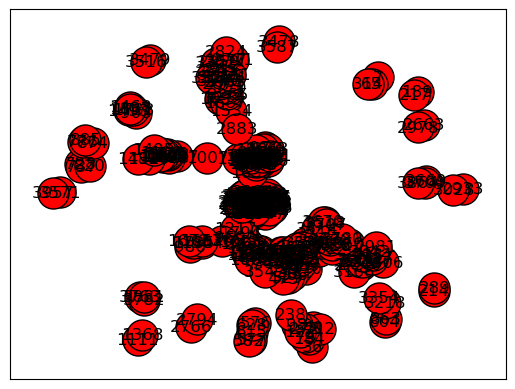

14
 	 node 14 is connected with :41
 	 node 14 is connected with :343
30
 	 node 30 is connected with :200
33
38
 	 node 38 is connected with :117
 	 node 38 is connected with :141
41
 	 node 41 is connected with :14
 	 node 41 is connected with :137
 	 node 41 is connected with :140
 	 node 41 is connected with :343
46
60
108
 	 node 108 is connected with :320
117
 	 node 117 is connected with :38
137
 	 node 137 is connected with :41
 	 node 137 is connected with :140
140
 	 node 140 is connected with :41
 	 node 140 is connected with :137
141
 	 node 141 is connected with :38
 	 node 141 is connected with :257
185
 	 node 185 is connected with :200
 	 node 185 is connected with :297
200
 	 node 200 is connected with :30
 	 node 200 is connected with :185
 	 node 200 is connected with :297
 	 node 200 is connected with :325
257
 	 node 257 is connected with :141
270
273
297
 	 node 297 is connected with :185
 	 node 297 is connected with :200
319
320
 	 node 320 is connected with :10

1853
1854
 	 node 1854 is connected with :1797
1856
1858
 	 node 1858 is connected with :1150
 	 node 1858 is connected with :1283
 	 node 1858 is connected with :1702
 	 node 1858 is connected with :1805
1879
 	 node 1879 is connected with :1130
 	 node 1879 is connected with :1181
 	 node 1879 is connected with :1198
 	 node 1879 is connected with :1199
 	 node 1879 is connected with :1250
 	 node 1879 is connected with :1285
 	 node 1879 is connected with :1312
 	 node 1879 is connected with :1351
 	 node 1879 is connected with :1380
 	 node 1879 is connected with :1399
 	 node 1879 is connected with :1613
 	 node 1879 is connected with :1662
 	 node 1879 is connected with :1668
 	 node 1879 is connected with :1721
 	 node 1879 is connected with :1736
 	 node 1879 is connected with :1810
 	 node 1879 is connected with :1827
1880
 	 node 1880 is connected with :1097
 	 node 1880 is connected with :1118
 	 node 1880 is connected with :1232
 	 node 1880 is connected with :1601
1885
 	 

 	 node 3293 is connected with :2683
 	 node 3293 is connected with :2786
 	 node 3293 is connected with :2994
 	 node 3293 is connected with :3073
 	 node 3293 is connected with :3243
 	 node 3293 is connected with :3362
3313
 	 node 3313 is connected with :3140
 	 node 3313 is connected with :3152
 	 node 3313 is connected with :3342
3330
 	 node 3330 is connected with :2832
 	 node 3330 is connected with :3049
 	 node 3330 is connected with :3132
 	 node 3330 is connected with :3152
 	 node 3330 is connected with :3240
 	 node 3330 is connected with :3358
 	 node 3330 is connected with :3369
 	 node 3330 is connected with :3381
 	 node 3330 is connected with :3396
 	 node 3330 is connected with :3422
3342
 	 node 3342 is connected with :2787
 	 node 3342 is connected with :2856
 	 node 3342 is connected with :2921
 	 node 3342 is connected with :3097
 	 node 3342 is connected with :3140
 	 node 3342 is connected with :3240
 	 node 3342 is connected with :3313
3349
 	 node 3349 is co

 	 node 2525 is connected with :2209
 	 node 2525 is connected with :2211
 	 node 2525 is connected with :2425
2527
 	 node 2527 is connected with :2443
2535
 	 node 2535 is connected with :2487
2546
 	 node 2546 is connected with :2064
 	 node 2546 is connected with :2084
 	 node 2546 is connected with :2150
 	 node 2546 is connected with :2201
 	 node 2546 is connected with :2212
 	 node 2546 is connected with :2340
 	 node 2546 is connected with :2354
 	 node 2546 is connected with :2623
 	 node 2546 is connected with :2646
2549
 	 node 2549 is connected with :1925
 	 node 2549 is connected with :1938
 	 node 2549 is connected with :2064
 	 node 2549 is connected with :2150
 	 node 2549 is connected with :2201
 	 node 2549 is connected with :2212
 	 node 2549 is connected with :2229
 	 node 2549 is connected with :2340
 	 node 2549 is connected with :2354
 	 node 2549 is connected with :2392
 	 node 2549 is connected with :2404
 	 node 2549 is connected with :2482
2569
2585
 	 node 

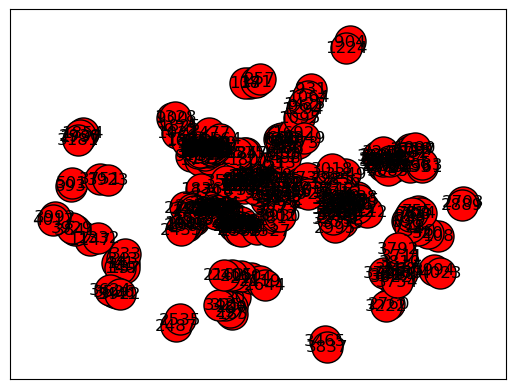

0
 	 node 0 is connected with :25
 	 node 0 is connected with :31
 	 node 0 is connected with :45
 	 node 0 is connected with :62
 	 node 0 is connected with :68
 	 node 0 is connected with :70
 	 node 0 is connected with :72
 	 node 0 is connected with :75
 	 node 0 is connected with :91
 	 node 0 is connected with :99
 	 node 0 is connected with :104
 	 node 0 is connected with :112
 	 node 0 is connected with :118
 	 node 0 is connected with :121
 	 node 0 is connected with :125
 	 node 0 is connected with :143
 	 node 0 is connected with :145
 	 node 0 is connected with :150
 	 node 0 is connected with :152
 	 node 0 is connected with :153
 	 node 0 is connected with :158
 	 node 0 is connected with :163
 	 node 0 is connected with :169
 	 node 0 is connected with :174
 	 node 0 is connected with :177
 	 node 0 is connected with :178
 	 node 0 is connected with :194
 	 node 0 is connected with :196
 	 node 0 is connected with :198
 	 node 0 is connected with :203
 	 node 0 is conne

1359
 	 node 1359 is connected with :1056
 	 node 1359 is connected with :1160
 	 node 1359 is connected with :1402
 	 node 1359 is connected with :1663
 	 node 1359 is connected with :1669
 	 node 1359 is connected with :1791
 	 node 1359 is connected with :1839
1364
 	 node 1364 is connected with :1435
 	 node 1364 is connected with :1540
1392
 	 node 1392 is connected with :1009
 	 node 1392 is connected with :1475
 	 node 1392 is connected with :1655
 	 node 1392 is connected with :1716
1400
 	 node 1400 is connected with :641
1401
 	 node 1401 is connected with :1823
 	 node 1401 is connected with :1839
1402
 	 node 1402 is connected with :1160
 	 node 1402 is connected with :1331
 	 node 1402 is connected with :1359
 	 node 1402 is connected with :1431
 	 node 1402 is connected with :1663
 	 node 1402 is connected with :1791
 	 node 1402 is connected with :1823
 	 node 1402 is connected with :1839
1405
 	 node 1405 is connected with :1846
 	 node 1405 is connected with :3412
1420

516
 	 node 516 is connected with :389
 	 node 516 is connected with :459
534
 	 node 534 is connected with :349
666
587
595
 	 node 595 is connected with :659
598
 	 node 598 is connected with :625
608
625
 	 node 625 is connected with :598
638
659
 	 node 659 is connected with :595
663
671
672
714
 	 node 714 is connected with :725
 	 node 714 is connected with :806
725
 	 node 725 is connected with :714
 	 node 725 is connected with :806
727
 	 node 727 is connected with :847
733
 	 node 733 is connected with :782
745
 	 node 745 is connected with :790
 	 node 745 is connected with :799
 	 node 745 is connected with :847
764
 	 node 764 is connected with :807
782
 	 node 782 is connected with :733
790
 	 node 790 is connected with :745
796
 	 node 796 is connected with :806
799
 	 node 799 is connected with :745
801
806
 	 node 806 is connected with :714
 	 node 806 is connected with :725
 	 node 806 is connected with :796
807
 	 node 807 is connected with :764
847
 	 node 847 is co

 	 node 2956 is connected with :2731
 	 node 2956 is connected with :2756
 	 node 2956 is connected with :2887
 	 node 2956 is connected with :2913
 	 node 2956 is connected with :2925
 	 node 2956 is connected with :2927
 	 node 2956 is connected with :2960
 	 node 2956 is connected with :2969
 	 node 2956 is connected with :3123
 	 node 2956 is connected with :3184
 	 node 2956 is connected with :3220
 	 node 2956 is connected with :3238
2960
 	 node 2960 is connected with :2810
 	 node 2960 is connected with :2867
 	 node 2960 is connected with :2897
 	 node 2960 is connected with :2909
 	 node 2960 is connected with :2925
 	 node 2960 is connected with :2927
 	 node 2960 is connected with :2956
 	 node 2960 is connected with :2969
 	 node 2960 is connected with :3153
 	 node 2960 is connected with :3184
2969
 	 node 2969 is connected with :2689
 	 node 2969 is connected with :2705
 	 node 2969 is connected with :2896
 	 node 2969 is connected with :2909
 	 node 2969 is connected wi

 	 node 2233 is connected with :1943
 	 node 2233 is connected with :1971
 	 node 2233 is connected with :1983
 	 node 2233 is connected with :2030
 	 node 2233 is connected with :2046
 	 node 2233 is connected with :2058
 	 node 2233 is connected with :2069
 	 node 2233 is connected with :2074
 	 node 2233 is connected with :2088
 	 node 2233 is connected with :2090
 	 node 2233 is connected with :2139
 	 node 2233 is connected with :2140
 	 node 2233 is connected with :2165
 	 node 2233 is connected with :2216
 	 node 2233 is connected with :2257
 	 node 2233 is connected with :2356
 	 node 2233 is connected with :2499
 	 node 2233 is connected with :2504
 	 node 2233 is connected with :2550
 	 node 2233 is connected with :2559
 	 node 2233 is connected with :2574
 	 node 2233 is connected with :2615
 	 node 2233 is connected with :2655
2251
 	 node 2251 is connected with :2618
2257
 	 node 2257 is connected with :1943
 	 node 2257 is connected with :1971
 	 node 2257 is connected wi

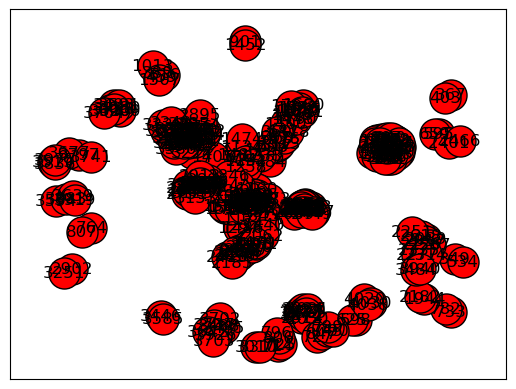

2
3
 	 node 3 is connected with :26
 	 node 3 is connected with :142
 	 node 3 is connected with :280
10
 	 node 10 is connected with :142
26
 	 node 26 is connected with :3
 	 node 26 is connected with :113
 	 node 26 is connected with :142
 	 node 26 is connected with :265
 	 node 26 is connected with :280
28
 	 node 28 is connected with :144
37
39
 	 node 39 is connected with :280
89
100
106
113
 	 node 113 is connected with :26
 	 node 113 is connected with :142
 	 node 113 is connected with :148
127
 	 node 127 is connected with :197
130
142
 	 node 142 is connected with :3
 	 node 142 is connected with :10
 	 node 142 is connected with :26
 	 node 142 is connected with :113
 	 node 142 is connected with :280
144
 	 node 144 is connected with :28
148
 	 node 148 is connected with :113
166
171
 	 node 171 is connected with :3003
183
195
197
 	 node 197 is connected with :127
209
230
233
235
237
265
 	 node 265 is connected with :26
280
 	 node 280 is connected with :3
 	 node 280 i

1441
 	 node 1441 is connected with :1434
1456
 	 node 1456 is connected with :960
 	 node 1456 is connected with :1078
 	 node 1456 is connected with :1117
 	 node 1456 is connected with :1126
 	 node 1456 is connected with :1175
 	 node 1456 is connected with :1184
 	 node 1456 is connected with :1524
 	 node 1456 is connected with :1542
 	 node 1456 is connected with :1547
 	 node 1456 is connected with :1559
 	 node 1456 is connected with :1604
 	 node 1456 is connected with :1665
 	 node 1456 is connected with :1746
 	 node 1456 is connected with :1768
 	 node 1456 is connected with :1793
 	 node 1456 is connected with :1868
 	 node 1456 is connected with :1888
1491
 	 node 1491 is connected with :952
 	 node 1491 is connected with :1076
 	 node 1491 is connected with :1078
 	 node 1491 is connected with :1126
 	 node 1491 is connected with :1184
 	 node 1491 is connected with :1291
 	 node 1491 is connected with :1547
 	 node 1491 is connected with :1559
 	 node 1491 is connected

 	 node 779 is connected with :828
 	 node 779 is connected with :838
805
 	 node 805 is connected with :695
 	 node 805 is connected with :705
 	 node 805 is connected with :715
 	 node 805 is connected with :734
 	 node 805 is connected with :754
 	 node 805 is connected with :756
 	 node 805 is connected with :810
 	 node 805 is connected with :828
 	 node 805 is connected with :830
 	 node 805 is connected with :838
809
 	 node 809 is connected with :705
 	 node 809 is connected with :720
810
 	 node 810 is connected with :695
 	 node 810 is connected with :705
 	 node 810 is connected with :805
 	 node 810 is connected with :828
813
828
 	 node 828 is connected with :705
 	 node 828 is connected with :754
 	 node 828 is connected with :779
 	 node 828 is connected with :805
 	 node 828 is connected with :810
 	 node 828 is connected with :830
 	 node 828 is connected with :838
830
 	 node 830 is connected with :695
 	 node 830 is connected with :705
 	 node 830 is connected with :

 	 node 3066 is connected with :3126
 	 node 3066 is connected with :3128
3080
 	 node 3080 is connected with :2809
 	 node 3080 is connected with :3394
3091
3094
3102
 	 node 3102 is connected with :2828
 	 node 3102 is connected with :2992
 	 node 3102 is connected with :3116
 	 node 3102 is connected with :3169
 	 node 3102 is connected with :3277
 	 node 3102 is connected with :3297
 	 node 3102 is connected with :3347
3110
3114
 	 node 3114 is connected with :2821
 	 node 3114 is connected with :3119
 	 node 3114 is connected with :3394
3116
 	 node 3116 is connected with :2828
 	 node 3116 is connected with :2973
 	 node 3116 is connected with :3102
 	 node 3116 is connected with :3169
 	 node 3116 is connected with :3297
 	 node 3116 is connected with :3298
 	 node 3116 is connected with :3332
 	 node 3116 is connected with :3347
3119
 	 node 3119 is connected with :2773
 	 node 3119 is connected with :2821
 	 node 3119 is connected with :2864
 	 node 3119 is connected with :297

 	 node 2630 is connected with :2654
2631
 	 node 2631 is connected with :1917
 	 node 2631 is connected with :1942
 	 node 2631 is connected with :1984
 	 node 2631 is connected with :1993
 	 node 2631 is connected with :2124
 	 node 2631 is connected with :2172
 	 node 2631 is connected with :2253
 	 node 2631 is connected with :2347
 	 node 2631 is connected with :2520
 	 node 2631 is connected with :2611
 	 node 2631 is connected with :2630
2637
 	 node 2637 is connected with :2029
 	 node 2637 is connected with :2362
 	 node 2637 is connected with :2452
2654
 	 node 2654 is connected with :1917
 	 node 2654 is connected with :1984
 	 node 2654 is connected with :1993
 	 node 2654 is connected with :2124
 	 node 2654 is connected with :2154
 	 node 2654 is connected with :2172
 	 node 2654 is connected with :2179
 	 node 2654 is connected with :2213
 	 node 2654 is connected with :2253
 	 node 2654 is connected with :2520
 	 node 2654 is connected with :2611
 	 node 2654 is connect

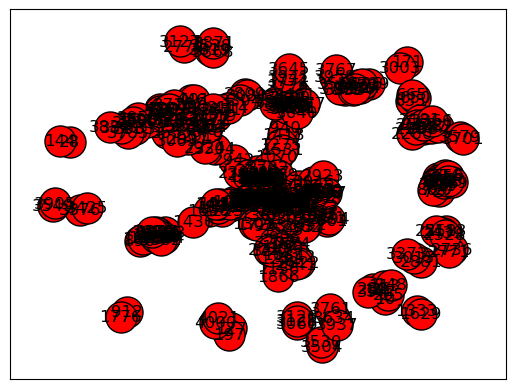

13
 	 node 13 is connected with :82
 	 node 13 is connected with :119
 	 node 13 is connected with :252
22
 	 node 22 is connected with :324
48
 	 node 48 is connected with :73
 	 node 48 is connected with :119
 	 node 48 is connected with :180
 	 node 48 is connected with :322
50
 	 node 50 is connected with :119
 	 node 50 is connected with :331
73
 	 node 73 is connected with :48
 	 node 73 is connected with :331
74
82
 	 node 82 is connected with :13
 	 node 82 is connected with :84
 	 node 82 is connected with :119
 	 node 82 is connected with :170
 	 node 82 is connected with :252
 	 node 82 is connected with :331
84
 	 node 84 is connected with :82
 	 node 84 is connected with :276
85
 	 node 85 is connected with :170
 	 node 85 is connected with :322
92
 	 node 92 is connected with :180
119
 	 node 119 is connected with :13
 	 node 119 is connected with :48
 	 node 119 is connected with :50
 	 node 119 is connected with :82
 	 node 119 is connected with :170
 	 node 119 is conn

410
 	 node 410 is connected with :348
 	 node 410 is connected with :382
 	 node 410 is connected with :500
439
 	 node 439 is connected with :348
 	 node 439 is connected with :408
 	 node 439 is connected with :420
 	 node 439 is connected with :500
 	 node 439 is connected with :514
 	 node 439 is connected with :538
468
 	 node 468 is connected with :348
469
 	 node 469 is connected with :348
 	 node 469 is connected with :497
 	 node 469 is connected with :505
489
 	 node 489 is connected with :348
496
 	 node 496 is connected with :348
 	 node 496 is connected with :497
 	 node 496 is connected with :508
 	 node 496 is connected with :514
 	 node 496 is connected with :565
497
 	 node 497 is connected with :348
 	 node 497 is connected with :350
 	 node 497 is connected with :391
 	 node 497 is connected with :469
 	 node 497 is connected with :496
 	 node 497 is connected with :500
 	 node 497 is connected with :503
 	 node 497 is connected with :510
 	 node 497 is connected wi

 	 node 2680 is connected with :2917
 	 node 2680 is connected with :2943
 	 node 2680 is connected with :3078
 	 node 2680 is connected with :3149
 	 node 2680 is connected with :3348
2696
 	 node 2696 is connected with :2751
2713
2719
 	 node 2719 is connected with :2661
 	 node 2719 is connected with :2778
 	 node 2719 is connected with :2936
 	 node 2719 is connected with :3035
 	 node 2719 is connected with :3100
 	 node 2719 is connected with :3225
 	 node 2719 is connected with :3258
 	 node 2719 is connected with :3397
2745
 	 node 2745 is connected with :2664
 	 node 2745 is connected with :2676
 	 node 2745 is connected with :3078
2751
 	 node 2751 is connected with :2696
 	 node 2751 is connected with :2868
 	 node 2751 is connected with :3035
 	 node 2751 is connected with :3198
 	 node 2751 is connected with :3302
2778
 	 node 2778 is connected with :2661
 	 node 2778 is connected with :2719
 	 node 2778 is connected with :3035
 	 node 2778 is connected with :3100
 	 node 

 	 node 2129 is connected with :1922
 	 node 2129 is connected with :1930
 	 node 2129 is connected with :2342
 	 node 2129 is connected with :2357
 	 node 2129 is connected with :2373
 	 node 2129 is connected with :2440
 	 node 2129 is connected with :2448
 	 node 2129 is connected with :2540
 	 node 2129 is connected with :2628
 	 node 2129 is connected with :2656
2141
 	 node 2141 is connected with :2289
 	 node 2141 is connected with :2318
2142
 	 node 2142 is connected with :1966
 	 node 2142 is connected with :2043
 	 node 2142 is connected with :2056
 	 node 2142 is connected with :2077
 	 node 2142 is connected with :2078
 	 node 2142 is connected with :2083
 	 node 2142 is connected with :2095
 	 node 2142 is connected with :2122
 	 node 2142 is connected with :2164
 	 node 2142 is connected with :2287
 	 node 2142 is connected with :2299
 	 node 2142 is connected with :2311
 	 node 2142 is connected with :2326
 	 node 2142 is connected with :2387
 	 node 2142 is connected wi

 	 node 3593 is connected with :3443
 	 node 3593 is connected with :3486
 	 node 3593 is connected with :3506
 	 node 3593 is connected with :3558
 	 node 3593 is connected with :3648
 	 node 3593 is connected with :3758
 	 node 3593 is connected with :3818
 	 node 3593 is connected with :3947
3595
3607
 	 node 3607 is connected with :3698
3608
 	 node 3608 is connected with :3705
3616
3635
 	 node 3635 is connected with :3838
3637
3648
 	 node 3648 is connected with :3506
 	 node 3648 is connected with :3558
 	 node 3648 is connected with :3593
 	 node 3648 is connected with :3758
 	 node 3648 is connected with :3816
3668
 	 node 3668 is connected with :3464
 	 node 3668 is connected with :3469
3681
 	 node 3681 is connected with :3559
3690
 	 node 3690 is connected with :3506
 	 node 3690 is connected with :3539
 	 node 3690 is connected with :3564
 	 node 3690 is connected with :3758
3695
3698
 	 node 3698 is connected with :3526
 	 node 3698 is connected with :3607
3705
 	 node 37

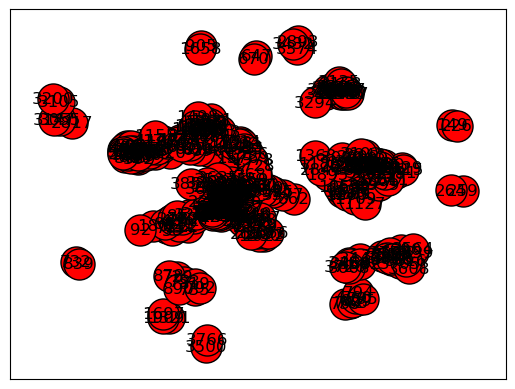

17
 	 node 17 is connected with :326
20
 	 node 20 is connected with :326
27
61
67
 	 node 67 is connected with :188
 	 node 67 is connected with :199
 	 node 67 is connected with :285
 	 node 67 is connected with :304
 	 node 67 is connected with :313
83
86
129
131
133
 	 node 133 is connected with :188
151
159
 	 node 159 is connected with :172
164
 	 node 164 is connected with :285
172
 	 node 172 is connected with :159
 	 node 172 is connected with :199
 	 node 172 is connected with :304
 	 node 172 is connected with :313
188
 	 node 188 is connected with :67
 	 node 188 is connected with :133
 	 node 188 is connected with :285
 	 node 188 is connected with :304
199
 	 node 199 is connected with :67
 	 node 199 is connected with :172
 	 node 199 is connected with :304
 	 node 199 is connected with :313
229
241
243
245
249
 	 node 249 is connected with :254
 	 node 249 is connected with :304
250
251
254
 	 node 254 is connected with :249
279
285
 	 node 285 is connected with :67
 	 

1500
 	 node 1500 is connected with :1167
 	 node 1500 is connected with :1444
 	 node 1500 is connected with :1504
 	 node 1500 is connected with :1525
 	 node 1500 is connected with :1630
1503
 	 node 1503 is connected with :1850
1504
 	 node 1504 is connected with :1066
 	 node 1504 is connected with :1167
 	 node 1504 is connected with :1310
 	 node 1504 is connected with :1338
 	 node 1504 is connected with :1500
 	 node 1504 is connected with :1525
 	 node 1504 is connected with :1630
 	 node 1504 is connected with :1725
1512
 	 node 1512 is connected with :428
 	 node 1512 is connected with :1237
1523
 	 node 1523 is connected with :1079
1525
 	 node 1525 is connected with :1338
 	 node 1525 is connected with :1473
 	 node 1525 is connected with :1500
 	 node 1525 is connected with :1504
 	 node 1525 is connected with :1630
1556
 	 node 1556 is connected with :966
 	 node 1556 is connected with :1789
1566
 	 node 1566 is connected with :1356
 	 node 1566 is connected with :1910


562
669
 	 node 669 is connected with :370
 	 node 669 is connected with :428
 	 node 669 is connected with :465
646
 	 node 646 is connected with :370
 	 node 646 is connected with :634
634
 	 node 634 is connected with :646
574
 	 node 574 is connected with :631
573
 	 node 573 is connected with :589
 	 node 573 is connected with :592
 	 node 573 is connected with :619
 	 node 573 is connected with :654
589
 	 node 589 is connected with :573
 	 node 589 is connected with :592
 	 node 589 is connected with :654
592
 	 node 592 is connected with :573
 	 node 592 is connected with :589
 	 node 592 is connected with :619
 	 node 592 is connected with :654
600
 	 node 600 is connected with :627
 	 node 600 is connected with :632
 	 node 600 is connected with :643
 	 node 600 is connected with :658
602
613
619
 	 node 619 is connected with :573
 	 node 619 is connected with :592
 	 node 619 is connected with :654
627
 	 node 627 is connected with :600
 	 node 627 is connected with :632
 	 

 	 node 2776 is connected with :1684
 	 node 2776 is connected with :2861
2804
 	 node 2804 is connected with :1684
2831
 	 node 2831 is connected with :1684
 	 node 2831 is connected with :2772
 	 node 2831 is connected with :3214
 	 node 2831 is connected with :3256
 	 node 2831 is connected with :3365
2837
 	 node 2837 is connected with :1684
2846
 	 node 2846 is connected with :1684
 	 node 2846 is connected with :2742
 	 node 2846 is connected with :2748
 	 node 2846 is connected with :3188
 	 node 2846 is connected with :3320
2848
 	 node 2848 is connected with :1684
 	 node 2848 is connected with :3133
 	 node 2848 is connected with :3214
2861
 	 node 2861 is connected with :1684
 	 node 2861 is connected with :2776
 	 node 2861 is connected with :3122
2878
 	 node 2878 is connected with :1684
 	 node 2878 is connected with :3214
2894
 	 node 2894 is connected with :1684
 	 node 2894 is connected with :2742
 	 node 2894 is connected with :3060
 	 node 2894 is connected with :307

 	 node 1990 is connected with :1978
 	 node 1990 is connected with :2286
1999
 	 node 1999 is connected with :2027
 	 node 1999 is connected with :2640
 	 node 1999 is connected with :2647
2021
2023
 	 node 2023 is connected with :1960
 	 node 2023 is connected with :2035
 	 node 2023 is connected with :2091
 	 node 2023 is connected with :2236
 	 node 2023 is connected with :2488
2035
 	 node 2035 is connected with :1960
 	 node 2035 is connected with :2023
 	 node 2035 is connected with :2082
 	 node 2035 is connected with :2091
 	 node 2035 is connected with :2107
 	 node 2035 is connected with :2236
 	 node 2035 is connected with :2488
2051
2076
 	 node 2076 is connected with :2170
 	 node 2076 is connected with :2426
2079
2082
 	 node 2082 is connected with :2035
 	 node 2082 is connected with :2488
2091
 	 node 2091 is connected with :1960
 	 node 2091 is connected with :2023
 	 node 2091 is connected with :2035
 	 node 2091 is connected with :2146
 	 node 2091 is connected with

 	 node 2506 is connected with :2262
 	 node 2506 is connected with :2278
 	 node 2506 is connected with :2339
 	 node 2506 is connected with :2507
 	 node 2506 is connected with :2602
 	 node 2506 is connected with :2619
2507
 	 node 2507 is connected with :1929
 	 node 2507 is connected with :2104
 	 node 2507 is connected with :2136
 	 node 2507 is connected with :2190
 	 node 2507 is connected with :2200
 	 node 2507 is connected with :2220
 	 node 2507 is connected with :2258
 	 node 2507 is connected with :2278
 	 node 2507 is connected with :2308
 	 node 2507 is connected with :2339
 	 node 2507 is connected with :2430
 	 node 2507 is connected with :2446
 	 node 2507 is connected with :2469
 	 node 2507 is connected with :2506
 	 node 2507 is connected with :2532
 	 node 2507 is connected with :2602
 	 node 2507 is connected with :2619
2522
 	 node 2522 is connected with :2176
2532
 	 node 2532 is connected with :2136
 	 node 2532 is connected with :2190
 	 node 2532 is connect

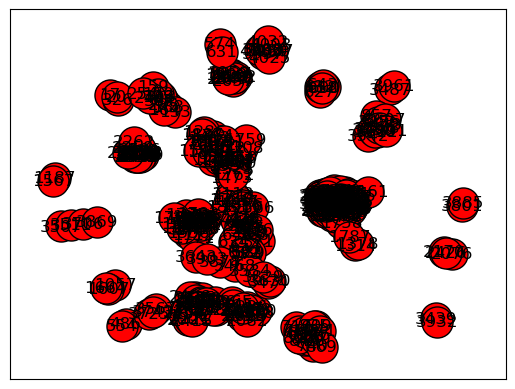

In [50]:
for i in  range(10):
    with open(absolute_path+"k_"+ str(i) +".txt", 'w') as fp:
        for item in comm[i]:
            print(item)
            for j in range(row):
                if edge_mat[item][j]==1 and j in comm[i]:
                    items = str(item)+ ' ' +str(j)
                    fp.write( "%s\n" % items )
                    print(' \t node '+str(item) + ' is connected with :'+str(j))
        print( 'Done adding k_'+ str(i) )
    Graph = nx.read_edgelist(absolute_path+"k_"+ str(i) +".txt",create_using=nx.Graph(),nodetype=int)
    sp = nx.spring_layout(Graph)
    nx.draw_networkx(Graph,pos=sp,node_color='red',with_labels=True,edgecolors='black',node_size=500)
    plt.show()

# Application w_topsis pour chaque cluster 

In [51]:
from math import *
import import_ipynb 
from TOPSIS import Topsis

importing Jupyter notebook from TOPSIS.ipynb


In [52]:

def apply_w_topsis(dx):    
    Graph = nx.read_edgelist(absolute_path+"k_"+ str(dx) +".txt",create_using=nx.Graph(),nodetype=int)
    sp = nx.spring_layout(Graph)
    nx.draw_networkx(Graph,pos=sp,node_color='red',with_labels=True,edgecolors='black',node_size=500)
    row = Graph.number_of_nodes()
    print(row)
    plt.rcParams.update({'figure.figsize': (15, 10)})
    deg_centrality = nx.degree_centrality(Graph)
    bet_centrality = nx.betweenness_centrality(Graph)
    close_centrality = nx.closeness_centrality(Graph)
    #eig_centrality=nx.eigenvector_centrality(Graph)
    Matrix=pd.DataFrame()
    for noued in Graph:
    #add the name of each node with its measures centrality
        Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
                        'CC':close_centrality[noued]}, ignore_index=True)
    Matrix.to_csv(absolute_path+"data/Matrix.csv" ,index=False)
    Matrix_arr= Matrix[['DC','BC','CC']].to_numpy()
    m = row
    ev_matrix_np = Matrix_arr
    sum = np.zeros(4)

    for i in range(m):
        for j in range(3):
            sum[j] += ev_matrix_np[i][j]

    p = np.copy(ev_matrix_np)

    for i in range(m):
        for j in range(3):
            p[i][j] = ev_matrix_np[i][j]/sum[j]
    k = 1/log(m)
    E = []
    for j in range(3):
        temp_sum = 0
        for i in range(m):
            try:
                pij = p[i][j]
                temp_sum += pij*log(pij)
            except:
                pij = 1
                temp_sum += pij*log(pij)
        E.append(-k*temp_sum)
    D = []
    for i in range(3):
        D.append(1-E[i])
    sm = np.sum(D)
    weights = [D[i]/sm for i in range(3)]
    weights
    Evaluation_matrix = Matrix_arr

    criteria = np.array([True,True,True,True])

    T = Topsis(Evaluation_matrix,weights,criteria)
    print(T.calc())
    print("best_distance\t", T.best_distance)
    print("worst_distance\t", T.worst_distance)
    print("worst_similarity\t", T.worst_similarity)
    print("rank_to_worst_similarity\t", T.rank_to_worst_similarity())
    print("best_similarity\t", T.best_similarity)
    print("rank_to_best_similarity\t", T.rank_to_best_similarity())
    #Convert S+ and S- to array numpy
    Best_Dist = np.array(T.best_distance)
    Worst_Dist = np.array(T.worst_distance)
# Calculate Closness
    Closnness = []
    Closnness = Worst_Dist / (Worst_Dist + Best_Dist)
# print(Closnness)
#Convert S+, S- and Closnness to DataFrame 
    Worst_Distance = pd.DataFrame(Worst_Dist,columns=['S-'])
    Best_Distance = pd.DataFrame(Best_Dist,columns=['S+'])
    Clos = pd.DataFrame(Closnness,columns=['C'])
# Concatenate results
    Out = pd.concat([Best_Distance, Worst_Distance, Clos], axis=1)
# print(Out)
#sort DataFrame by Closnness Column (Descending)
    Out = Out.sort_values(by="C",ascending=False)
# Out

# Save it into a csv file (out.csv)
    Out.to_csv(absolute_path+"data/Out_"+ str(dx) +".csv",index=False)
#Call the function Ranking_closness
#Function return the index of the grather value(Closness vector) based on a descending order
    def ranking_closness(data):
        return [i for i in data.argsort()[-len(data):][::-1]]
#Call the function Ranking_closness
    C = ranking_closness(Closnness)
#retrieve the nodes that correspond to the indices returned by the function above
    Tab = []
    for i in range(len(C)):
        Tab.append(Matrix['Node'].loc[C[i]])
#Convert Tab above to DataFrame 
    Tab_Data=pd.DataFrame(Tab,columns=["Node"])

    Tab_Data["Node"].to_csv(absolute_path+"data/cluster_topsis/Topsis_"+ str(dx) +".csv",index=False)
    Final_Tab = pd.concat([pd.read_csv(absolute_path+"data/Out_"+ str(dx) +".csv"),Tab_Data],axis=1)
    print(Final_Tab)

    Out1 = pd.concat([Matrix, Clos], axis=1)
# Out1
    Out1 = Out1.sort_values(by="C",ascending=False)
# Out1

# Save it into a csv file (out.csv)
    Out1.to_csv(absolute_path+"data/Out1_"+ str(dx) +".csv",index=False)
    # Final_Tab1 = pd.concat([pd.read_csv(absolute_path+"data/Out1_"+ str(dx) +".csv")],axis=1)
    res= pd.concat([pd.read_csv(absolute_path+"data/Out1_"+ str(dx) +".csv"),pd.read_csv(absolute_path+"data/Out_"+ str(dx) +".csv")],axis=1)
    res.to_csv(absolute_path+"data/res/res_"+ str(dx) +".csv",index=False)
    
    #The top-10 ranked nodes by degree centrality (DC)
    DCR = res[["Node", "DC"]]
    DCR = DCR.sort_values(by='DC', ascending=False)
    DCR.rename(columns = {'Node':'DCN'}, inplace=True)

    DCR["DCN"].to_csv(absolute_path+"data/SI/DCR"+ str(dx) +".csv",index=False)



#The top-10 ranked nodes by betweenness centrality (BC)
    BCR = res[["Node", "BC"]]
    BCR = BCR.sort_values(by='BC', ascending=False)
    BCR.rename(columns = {'Node':'BCN'}, inplace=True)

    BCR["BCN"].to_csv(absolute_path+"data/SI/BCR"+ str(dx) +".csv",index=False)



#The top-10 ranked nodes by closeness centrality (CC)
    CCR = res[["Node", "CC"]]
    CCR = CCR.sort_values(by='CC', ascending=False)
    CCR.rename(columns = {'Node':'CCN'}, inplace=True)

    CCR["CCN"].to_csv(absolute_path+"data/SI/CCR"+ str(dx) +".csv",index=False)


    fac = pd.concat([pd.read_csv(absolute_path+"data/SI/DCR"+ str(dx) +".csv"),pd.read_csv(absolute_path+"data/SI/BCR"+ str(dx) +".csv"), pd.read_csv(absolute_path+"data/SI/CCR"+ str(dx) +".csv")],axis=1)

    facebook = pd.concat([pd.read_csv(absolute_path+"data/cluster_topsis/Topsis_"+ str(dx) +".csv"),fac],axis=1)
    facebook.to_csv(absolute_path+"data/dataFilter/data"+ str(dx) +".csv",index=False)

cluster  0 :
351


C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: Futu

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: Futu

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: Futu

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: Futu

Step 1
 [[0.02857143 0.00064947 0.03214286]
 [0.02       0.00050266 0.02571429]
 [0.00571429 0.         0.02142857]
 ...
 [0.00285714 0.         0.00510204]
 [0.00285714 0.         0.00285714]
 [0.00285714 0.         0.00285714]]

Step 2
 [[0.06555158 0.00185785 0.02551587]
 [0.0458861  0.00143788 0.0204127 ]
 [0.01311032 0.         0.01701058]
 ...
 [0.00655516 0.         0.00405014]
 [0.00655516 0.         0.00226808]
 [0.00655516 0.         0.00226808]]

Step 3
 [[0.0091554  0.00146072 0.00189058]
 [0.00640878 0.00113052 0.00151246]
 [0.00183108 0.         0.00126038]
 ...
 [0.00091554 0.         0.00030009]
 [0.00091554 0.         0.00016805]
 [0.00091554 0.         0.00016805]]

Step 4
 [0.00091554 0.         0.00016805] [0.02288849 0.32823112 0.00705721]

Step 5
 [8.54377048e-03 5.76725002e-03 1.42527369e-03 2.15544246e-03
 1.36585857e-03 3.03441594e-03 2.97252370e-03 4.80586156e-03
 2.97362066e-03 4.79441465e-03 2.11206668e-03 8.01475448e-04
 8.01475448e-04 3.87136252e-03 5.6017

356


C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: Futu

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: Futu

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: Futu

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: Futu

Step 1
 [[0.0056338  0.00022281 0.0120089 ]
 [0.0056338  0.00012732 0.00912676]
 [0.01126761 0.00046153 0.01521127]
 ...
 [0.0028169  0.         0.0028169 ]
 [0.0028169  0.         0.00541712]
 [0.0028169  0.         0.00541712]]

Step 2
 [[0.01504908 0.0043774  0.01466558]
 [0.01504908 0.00250137 0.01114584]
 [0.03009817 0.00906748 0.0185764 ]
 ...
 [0.00752454 0.         0.00344007]
 [0.00752454 0.         0.00661553]
 [0.00752454 0.         0.00661553]]

Step 3
 [[0.0025083  0.00324642 0.00134473]
 [0.0025083  0.0018551  0.001022  ]
 [0.00501659 0.00672474 0.00170333]
 ...
 [0.00125415 0.         0.00031543]
 [0.00125415 0.         0.0006066 ]
 [0.00125415 0.         0.0006066 ]]

Step 4
 [0.00125415 0.         0.00031543] [0.05769082 0.35731923 0.01450983]

Step 5
 [3.62927252e-03 2.34808792e-03 7.82970750e-03 0.00000000e+00
 0.00000000e+00 1.31383266e-03 1.05143667e-04 1.05143667e-04
 3.09584646e-03 4.01457637e-04 2.98081063e-03 4.01457637e-04
 0.00000000e+00 0.00000000e+00 6.3086

342


C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: Futu

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: Futu

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: Futu

Step 1
 [[8.79765396e-03 2.58754528e-04 1.97561352e-02]
 [1.17302053e-02 8.62515094e-05 2.34604106e-02]
 [2.93255132e-03 0.00000000e+00 1.41647762e-02]
 ...
 [5.86510264e-03 0.00000000e+00 1.05571848e-02]
 [2.93255132e-03 0.00000000e+00 2.93255132e-03]
 [2.93255132e-03 0.00000000e+00 2.93255132e-03]]

Step 2
 [[0.01807163 0.00125915 0.01135871]
 [0.02409551 0.00041972 0.01348847]
 [0.00602388 0.         0.00814398]
 ...
 [0.01204776 0.         0.00606981]
 [0.00602388 0.         0.00168606]
 [0.00602388 0.         0.00168606]]

Step 3
 [[0.00223274 0.00098859 0.00103733]
 [0.00297699 0.00032953 0.00123183]
 [0.00074425 0.         0.00074375]
 ...
 [0.00148849 0.         0.00055432]
 [0.00074425 0.         0.00015398]
 [0.00074425 0.         0.00015398]]

Step 4
 [0.00074425 0.         0.00015398] [0.08037872 0.65799799 0.01154839]

Step 5
 [1.99330000e-03 2.50109753e-03 5.89766940e-04 6.69518415e-03
 2.58829029e-03 6.04069738e-04 6.04069738e-04 1.24376758e-02
 6.62897304e-01 5.65897046

336


C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: Futu

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: Futu

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: Futu

Step 1
 [[2.98507463e-03 0.00000000e+00 2.98507463e-03]
 [2.98507463e-03 0.00000000e+00 2.98507463e-03]
 [1.19402985e-02 8.93734918e-05 1.19402985e-02]
 ...
 [2.98507463e-03 0.00000000e+00 3.98009950e-03]
 [2.98507463e-03 0.00000000e+00 3.98009950e-03]
 [2.98507463e-03 0.00000000e+00 4.46552285e-02]]

Step 2
 [[0.0077115  0.         0.00330298]
 [0.0077115  0.         0.00330298]
 [0.03084598 0.00090327 0.0132119 ]
 ...
 [0.0077115  0.         0.00440397]
 [0.0077115  0.         0.00440397]
 [0.0077115  0.         0.04941086]]

Step 3
 [[0.00137127 0.         0.00027225]
 [0.00137127 0.         0.00027225]
 [0.00548507 0.0006682  0.00108899]
 ...
 [0.00137127 0.         0.000363  ]
 [0.00137127 0.         0.000363  ]
 [0.00137127 0.         0.0040727 ]]

Step 4
 [0.00137127 0.         0.00027225] [0.04388056 0.28608373 0.01059365]

Step 5
 [0.00000000e+00 0.00000000e+00 4.24699067e-03 1.44438928e-03
 3.50033248e-04 3.50033248e-04 1.44438928e-03 2.17798465e-04
 2.82466096e-03 2.17798465

291


C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: Futu

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: Futu

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: Futu

Step 1
 [[3.44827586e-03 0.00000000e+00 4.59770115e-03]
 [6.89655172e-03 2.38635008e-05 6.89655172e-03]
 [3.44827586e-03 0.00000000e+00 9.59520240e-03]
 [6.89655172e-03 1.67044505e-04 1.37931034e-02]
 [6.89655172e-03 1.67044505e-04 1.37931034e-02]
 [3.44827586e-03 0.00000000e+00 9.59520240e-03]
 [1.72413793e-02 5.48860518e-04 2.00626959e-02]
 [3.44827586e-03 0.00000000e+00 4.59770115e-03]
 [3.44827586e-03 0.00000000e+00 1.22605364e-02]
 [1.03448276e-02 1.67044505e-04 1.47126437e-02]
 [6.89655172e-03 0.00000000e+00 1.37931034e-02]
 [3.44827586e-03 0.00000000e+00 1.00313480e-02]
 [3.44827586e-03 0.00000000e+00 3.44827586e-03]
 [3.44827586e-03 0.00000000e+00 3.44827586e-03]
 [3.44827586e-03 0.00000000e+00 3.44827586e-03]
 [3.44827586e-03 0.00000000e+00 3.44827586e-03]
 [2.41379310e-01 4.94047617e-02 2.41379310e-01]
 [1.03448276e-02 0.00000000e+00 1.23332494e-01]
 [2.41379310e-02 7.83518275e-05 1.27041742e-01]
 [6.89655172e-03 0.00000000e+00 1.22438781e-01]
 [6.89655172e-03 0.00000000e+00 

313


C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: Futu

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: Futu

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: Futu

Step 1
 [[6.41025641e-03 0.00000000e+00 1.00160256e-02]
 [1.28205128e-02 1.23670542e-04 1.33547009e-02]
 [9.61538462e-03 8.24470278e-05 1.14468864e-02]
 [3.20512821e-03 0.00000000e+00 8.01282051e-03]
 [1.28205128e-02 1.64894056e-04 1.33547009e-02]
 [6.41025641e-03 4.12235139e-05 7.21153846e-03]
 [3.20512821e-03 0.00000000e+00 4.80769231e-03]
 [6.41025641e-03 4.12235139e-05 7.21153846e-03]
 [6.41025641e-03 0.00000000e+00 8.90313390e-03]
 [6.41025641e-03 0.00000000e+00 8.90313390e-03]
 [3.20512821e-03 0.00000000e+00 4.27350427e-03]
 [6.41025641e-03 2.06117569e-05 6.41025641e-03]
 [3.20512821e-03 0.00000000e+00 4.80769231e-03]
 [6.41025641e-03 0.00000000e+00 8.90313390e-03]
 [6.41025641e-03 0.00000000e+00 8.90313390e-03]
 [6.41025641e-03 8.24470278e-05 1.00160256e-02]
 [3.20512821e-03 0.00000000e+00 4.27350427e-03]
 [3.20512821e-03 0.00000000e+00 6.67735043e-03]
 [3.20512821e-03 0.00000000e+00 7.28438228e-03]
 [3.20512821e-02 2.84442246e-03 3.43915344e-02]
 [1.60256410e-02 3.40093990e-04 

316


C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: Futu

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: Futu

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: Futu

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: Futu

Step 1
 [[1.39682540e-01 1.80854649e-02 1.39682540e-01]
 [2.53968254e-02 1.88723756e-04 7.68253968e-02]
 [6.34920635e-03 0.00000000e+00 7.14654854e-02]
 [6.34920635e-03 0.00000000e+00 7.14654854e-02]
 [6.34920635e-03 0.00000000e+00 7.14654854e-02]
 [1.26984127e-02 0.00000000e+00 7.31670446e-02]
 [3.17460317e-03 0.00000000e+00 7.06440431e-02]
 [6.34920635e-03 0.00000000e+00 7.14654854e-02]
 [3.17460317e-03 0.00000000e+00 7.06440431e-02]
 [3.17460317e-03 0.00000000e+00 7.06440431e-02]
 [1.58730159e-02 5.05510060e-06 7.40485753e-02]
 [1.90476190e-02 6.40312742e-05 7.49516067e-02]
 [6.34920635e-03 0.00000000e+00 7.14654854e-02]
 [9.52380952e-03 0.00000000e+00 7.23062558e-02]
 [6.34920635e-03 0.00000000e+00 7.14654854e-02]
 [6.34920635e-03 0.00000000e+00 7.14654854e-02]
 [1.58730159e-02 5.05510060e-06 7.40485753e-02]
 [3.17460317e-03 0.00000000e+00 7.06440431e-02]
 [6.34920635e-03 0.00000000e+00 7.14654854e-02]
 [3.17460317e-03 0.00000000e+00 7.06440431e-02]
 [3.17460317e-03 0.00000000e+00 

313


C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: Futu

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: Futu

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: Futu

Step 1
 [[9.61538462e-03 0.00000000e+00 1.46520147e-02]
 [1.60256410e-02 2.06117569e-04 1.86480186e-02]
 [1.60256410e-02 2.06117569e-04 1.86480186e-02]
 [1.28205128e-02 1.44282299e-04 1.57790927e-02]
 [3.20512821e-03 0.00000000e+00 1.13960114e-02]
 [9.61538462e-03 1.44282299e-04 1.46520147e-02]
 [3.20512821e-03 0.00000000e+00 1.13960114e-02]
 [3.20512821e-03 0.00000000e+00 3.20512821e-03]
 [3.20512821e-03 0.00000000e+00 3.20512821e-03]
 [3.20512821e-03 0.00000000e+00 1.02564103e-02]
 [3.20512821e-03 0.00000000e+00 9.76800977e-03]
 [3.20512821e-03 0.00000000e+00 3.20512821e-03]
 [3.20512821e-03 0.00000000e+00 3.20512821e-03]
 [3.20512821e-03 0.00000000e+00 3.20512821e-03]
 [3.20512821e-03 0.00000000e+00 3.20512821e-03]
 [6.41025641e-03 0.00000000e+00 4.50309345e-02]
 [1.28205128e-02 3.69809273e-03 5.05332481e-02]
 [9.61538462e-03 6.52705637e-05 4.53867540e-02]
 [3.20512821e-03 0.00000000e+00 3.20512821e-03]
 [3.20512821e-03 0.00000000e+00 3.20512821e-03]
 [6.41025641e-03 0.00000000e+00 

320


C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: Futu

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: Futu

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: Futu

Step 1
 [[9.40438871e-03 0.00000000e+00 6.10668692e-02]
 [1.88087774e-02 3.39876755e-04 6.18350059e-02]
 [2.50783699e-02 2.14168828e-03 7.50516484e-02]
 [2.19435737e-02 2.08958251e-03 7.44830753e-02]
 [3.13479624e-03 0.00000000e+00 7.09021582e-02]
 [1.88087774e-02 9.46654011e-03 9.21728056e-02]
 [1.25391850e-02 4.66418687e-03 7.42954605e-02]
 [6.26959248e-03 3.17641827e-05 6.06899132e-02]
 [6.26959248e-03 1.89270716e-03 6.00718896e-02]
 [2.19435737e-02 1.29513839e-02 9.30451035e-02]
 [6.26959248e-03 0.00000000e+00 6.05652932e-02]
 [1.56739812e-02 2.03029458e-03 7.37382445e-02]
 [6.26959248e-03 6.21044538e-05 6.01944853e-02]
 [1.88087774e-02 6.57768940e-04 7.41087885e-02]
 [6.26959248e-03 1.64297497e-03 7.21156426e-02]
 [6.26959248e-03 0.00000000e+00 7.22923966e-02]
 [3.13479624e-03 0.00000000e+00 5.02475261e-02]
 [4.38871473e-02 3.69296024e-02 1.19899585e-01]
 [1.56739812e-02 2.21410436e-03 9.18856629e-02]
 [4.38871473e-02 8.74415740e-03 1.24980075e-01]
 [1.56739812e-02 1.87792039e-03 

341


C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: Futu

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: Futu

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_2752\1306851478.py:15: Futu

Step 1
 [[2.94117647e-03 0.00000000e+00 3.92156863e-03]
 [5.88235294e-03 1.73520736e-05 5.88235294e-03]
 [2.94117647e-03 0.00000000e+00 3.92156863e-03]
 ...
 [2.94117647e-03 0.00000000e+00 4.41176471e-03]
 [2.94117647e-03 0.00000000e+00 2.94117647e-03]
 [2.94117647e-03 0.00000000e+00 2.94117647e-03]]

Step 2
 [[0.00720002 0.         0.00275618]
 [0.01440005 0.00017165 0.00413427]
 [0.00720002 0.         0.00275618]
 ...
 [0.00720002 0.         0.00310071]
 [0.00720002 0.         0.00206714]
 [0.00720002 0.         0.00206714]]

Step 3
 [[0.00082114 0.         0.00028997]
 [0.00164228 0.00013402 0.00043495]
 [0.00082114 0.         0.00028997]
 ...
 [0.00082114 0.         0.00032621]
 [0.00082114 0.         0.00021747]
 [0.00082114 0.         0.00021747]]

Step 4
 [0.00082114 0.         0.00021747] [0.07143921 0.48855829 0.01856602]

Step 5
 [7.24913996e-05 8.59957553e-04 7.24913996e-05 3.51582812e-03
 3.01174951e-03 2.67898086e-03 3.82505630e-03 5.59894868e-03
 2.68807154e-03 6.59671736

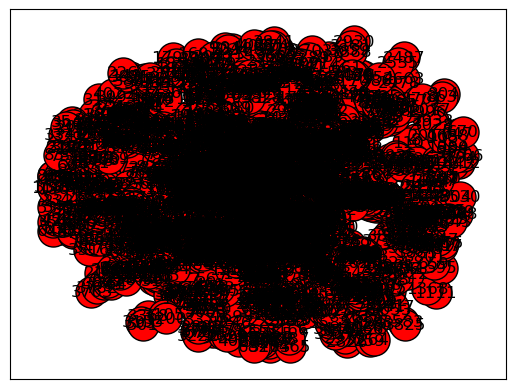

In [53]:
# Applying topsis on each cluster.
import os 
for i in range(10):
    file_size = os.stat(absolute_path+'k_'+str(i)+'.txt').st_size
    if file_size == 0:
        print('cluster ',i,':')
        FF = pd.DataFrame(Final_Tab.loc[i])
        print(FF.T)
    else:
        print('cluster ',i,':')
        apply_w_topsis(i)

In [54]:
for i in range(10):
    res =absolute_path+"data/res/res_"+ str(i)+'.csv'
    path = res
    if(os.path.isfile(path) == False):
        print('cluster',i,':')
        FF = pd.DataFrame(Final_Tab.loc[i])
        res = FF.T
        print(res)
    else:
        print('clusterS',i,':')
        res = pd.read_csv(absolute_path+"data/res/res_"+ str(i) +".csv")
        res =res.head(1)
        print(res)
    res.to_csv(absolute_path+'data/res1/res_'+str(i)+'.csv', index=False, encoding='utf-8-sig')
        

clusterS 0 :
   Node        DC        BC        CC         C        S+        S-       C.1
0  1577  0.065714  0.145941  0.116312  0.994426  0.001844  0.328916  0.994426
clusterS 1 :
   Node        DC        BC        CC         C        S+       S-       C.1
0   637  0.030986  0.024523  0.066355  0.889417  0.044462  0.35761  0.889417
clusterS 2 :
   Node        DC        BC        CC    C   S+        S-  C.1
0   107  0.316716  0.172224  0.219941  1.0  0.0  0.662897  1.0
clusterS 3 :
   Node        DC        BC        CC         C        S+        S-       C.1
0  1666  0.014925  0.038264  0.069924  0.884799  0.037264  0.286201  0.884799
clusterS 4 :
   Node        DC      BC        CC        C      S+        S-      C.1
0  1632  0.048276  0.0694  0.101567  0.85525  0.0569  0.336192  0.85525
clusterS 5 :
   Node        DC        BC        CC         C        S+       S-       C.1
0  1718  0.041667  0.087217  0.124808  0.972366  0.010984  0.38651  0.972366
clusterS 6 :
   Node        DC  

In [55]:
#then let's take the first node in each cluster and concatenat theme in one file 
# named final_res
import glob
ss = absolute_path+'data/res1/'
extension = 'csv'
all_filenames = [i for i in glob.glob(ss+'*.csv')]
#combine all files in the list
combined_csv = pd.concat([pd.read_csv(f) for f in all_filenames ])

#export to csv
combined_csv.to_csv(absolute_path+"data/res/final_res.csv", index=True, encoding='utf-8-sig')
print(combined_csv)


   Node        DC        BC        CC         C        S+        S-       C.1
0  1577  0.065714  0.145941  0.116312  0.994426  0.001844  0.328916  0.994426
0   637  0.030986  0.024523  0.066355  0.889417  0.044462  0.357610  0.889417
0   107  0.316716  0.172224  0.219941  1.000000  0.000000  0.662897  1.000000
0  1666  0.014925  0.038264  0.069924  0.884799  0.037264  0.286201  0.884799
0  1632  0.048276  0.069400  0.101567  0.855250  0.056900  0.336192  0.855250
0  1718  0.041667  0.087217  0.124808  0.972366  0.010984  0.386510  0.972366
0  1420  0.034921  0.101972  0.090927  0.888443  0.038498  0.306597  0.888443
0  1505  0.022436  0.096236  0.083380  0.929723  0.024930  0.329809  0.929723
0   136  0.043887  0.036930  0.119900  0.950957  0.019258  0.373423  0.950957
0  1684  0.255882  0.063257  0.251092  1.000000  0.000000  0.493976  1.000000


In [56]:
for dx in range(10):
        DCR = combined_csv[["Node", "DC"]]
        DCR = DCR.sort_values(by='DC', ascending=False)
        DCR.rename(columns = {'Node':'DCN'}, inplace=True)

        DCR["DCN"].to_csv(absolute_path+"data/nodeK/DCR"+ str(dx) +".csv",index=False)
        
        Node = combined_csv[["Node"]]
        Node['Node'].to_csv(absolute_path+"data/nodeK/Node"+ str(dx) +".csv",index=False)
#The top-10 ranked nodes by betweenness centrality (BC)
        BCR = combined_csv[["Node", "BC"]]
        BCR = BCR.sort_values(by='BC', ascending=False)
        BCR.rename(columns = {'Node':'BCN'}, inplace=True)

        BCR["BCN"].to_csv(absolute_path+"data/nodeK/BCR"+ str(dx) +".csv",index=False)



#The top-10 ranked nodes by closeness centrality (CC)
        CCR = combined_csv[["Node", "CC"]]
        CCR = CCR.sort_values(by='CC', ascending=False)
        CCR.rename(columns = {'Node':'CCN'}, inplace=True)

        CCR["CCN"].to_csv(absolute_path+"data/nodeK/CCR"+ str(dx) +".csv",index=False)





        facebookK = pd.concat([pd.read_csv(absolute_path+"data/nodeK/Node"+ str(dx) +".csv"),pd.read_csv(absolute_path+"data/nodeK/DCR"+ str(dx) +".csv"),pd.read_csv(absolute_path+"data/nodeK/BCR"+ str(dx) +".csv"), pd.read_csv(absolute_path+"data/nodeK/CCR"+ str(dx) +".csv")],axis=1)

facebookK.to_csv(absolute_path+"data/dataFilterK/data.csv",index=False)
    

In [57]:
facebookK

,Node,DCN,BCN,CCN
0,1577,107,107,1684
1,637,1684,1577,107
2,107,1577,1420,1718
3,1666,1632,1505,136
4,1632,136,1718,1577
5,1718,1718,1632,1632
6,1420,1420,1684,1420
7,1505,637,1666,1505
8,136,1505,136,1666
9,1684,1666,637,637


In [58]:
import ndlib.models.ModelConfig as mc
import ndlib.models.epidemics as ep

In [59]:
w_facebook = pd.read_csv("Data/w_topsisData.csv")
w_facebook

,w_DCN,w_BCN,w_CCN,w_ECN,w_Node
0,107,107,107,1912,107
1,1684,1684,58,2266,1684
2,1912,3437,428,2206,3437
3,3437,1912,563,2233,1912
4,0,1085,1684,2464,1085
5,2543,0,171,2142,0
6,2347,698,348,2218,698
7,1888,567,483,2078,567
8,1800,58,414,2123,58
9,1663,428,376,1993,428


# Application SI

In [60]:
def SI(node):
    n = row
    model = ep.SIModel(G)
    cfg = mc.Configuration()
    cfg.add_model_parameter('beta', 1)
    cfg.add_model_initial_configuration('Infected', node)
    model.set_initial_status(cfg)
    res = pd.DataFrame(columns=['iteration', 'nb_Susceptible', 'Nb_infected'])
    for i in range(n):
        iteration = model.iteration()
        res.loc[len(res.index)] = [iteration['iteration'],iteration['node_count'][0], iteration['node_count'][1] ]
        if iteration['node_count'][1] == n:
            break 
    return res

In [61]:
Rank_DC = SI(set(facebookK['DCN']))
Rank_BC = SI(set(facebookK['BCN']))
#Rank_EC = SI(set(facebookK['ECN']))
Rank_CC = SI(set(facebookK['CCN']))
Rank_kmeans = SI(set(facebookK['Node']))

In [62]:
w_Rank_DC = SI(set(w_facebook['w_DCN']))
w_Rank_BC = SI(set(w_facebook['w_BCN']))
w_Rank_CC = SI (set(w_facebook['w_CCN']))
w_Rank_EC = SI(set(w_facebook['w_ECN']))
w_Rank_Topsis = SI(set(w_facebook['w_Node']))

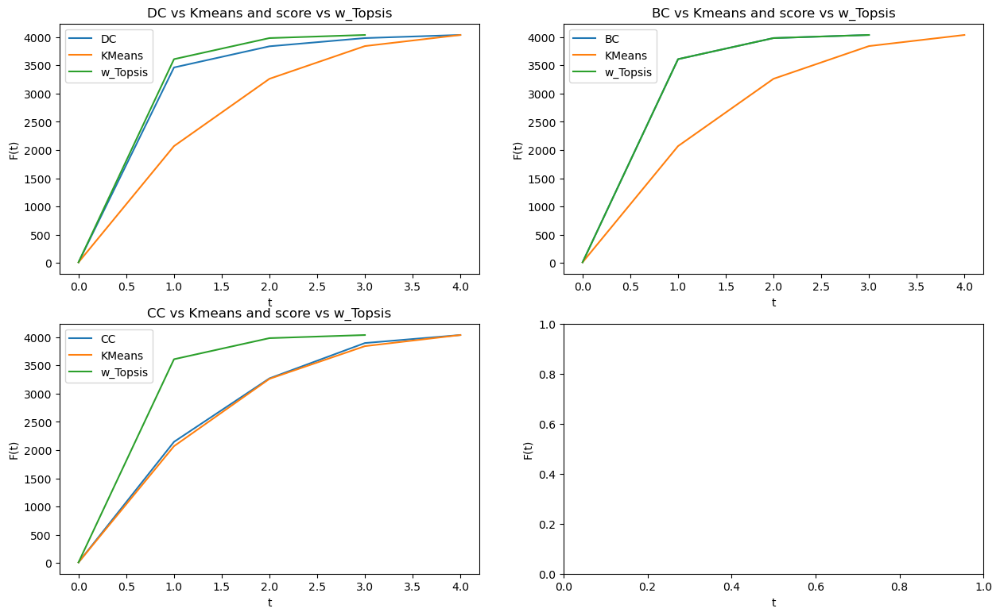

In [63]:
fig, axs = plt.subplots(2, 2, figsize=(15, 9))
axs[0, 0].plot(w_Rank_DC['iteration'], w_Rank_DC['Nb_infected'], label="DC")
axs[0, 0].plot(Rank_kmeans['iteration'],Rank_kmeans['Nb_infected'], label="KMeans")
axs[0, 0].plot(w_Rank_Topsis['iteration'], w_Rank_Topsis['Nb_infected'], label="w_Topsis")
axs[0, 0].set_title("DC vs Kmeans and score vs w_Topsis")
axs[0, 0].legend()

axs[0, 1].plot(w_Rank_BC['iteration'], w_Rank_BC['Nb_infected'], label="BC")
axs[0, 1].plot(Rank_kmeans['iteration'], Rank_kmeans['Nb_infected'], label="KMeans")
axs[0, 1].plot(w_Rank_Topsis['iteration'], w_Rank_Topsis['Nb_infected'], label="w_Topsis")
axs[0, 1].set_title("BC vs Kmeans and score vs w_Topsis")
axs[0, 1].legend()

axs[1, 0].plot(w_Rank_CC['iteration'], w_Rank_CC['Nb_infected'], label="CC")
axs[1, 0].plot(Rank_kmeans['iteration'], Rank_kmeans['Nb_infected'], label="KMeans")
axs[1, 0].plot(w_Rank_Topsis['iteration'], w_Rank_Topsis['Nb_infected'], label="w_Topsis")
axs[1, 0].set_title("CC vs Kmeans and score vs w_Topsis")
axs[1, 0].legend()



for ax in axs.flat:
    ax.set(xlabel='t', ylabel='F(t)')